In [1]:
import scanpy as sc
import anndata as ann
import numpy as np 
import seaborn as sb
import pandas as pd
import pickle
from sklearn import preprocessing as pp
import time
from scipy import sparse

import sys  
from importlib import reload  
import helper
reload(helper)
import helper as h

import expected_multiplet_rate as emr
reload(emr)
import expected_multiplet_rate as emr

from matplotlib import rcParams
import matplotlib.pyplot as plt

#R interface
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [2]:
%%R
library(scran)
library(biomaRt)
library(BiocParallel)
#library(Seurat)

In [3]:
# Path for saving results - last shared folder by all datasets
shared_folder = '/dss/dsshome1/lxc07/gobi009/data/' + 'GSE142465_human/'

In [4]:
#Load data
adata = sc.read_h5ad(shared_folder + 'data_normalised.h5ad')
#adata = h.open_h5ad(shared_folder + 'data_normalised.h5ad', unique_id2=UID2)
#adata = sc.read(shared_folder + 'data_normalised.h5ad')

## Load gene IDs

In [5]:
# Use EID info from cellrange data
# Assumes that all samples have same features, thus performs this for single sample

# Read CellRanger feature info
features_f = pd.read_table(shared_folder + 'human_spikein_drug_features.tsv', header=None)
features_f.columns = ['EID', 'gene_symbol_adata', 'feature_type'][:features_f.shape[1]]
features_f.index = features_f['EID']

# map gene names from Cellranger to gene names used in adata
af = ann.AnnData(var=features_f)
af.var_names = features_f['gene_symbol_adata']
af.var_names_make_unique()
features_f['gene_symbol_adata'] = af.var_names

# load features from adata
features_used = adata.var_names
# Keep only features in adata
features_f.index = features_f['gene_symbol_adata']
adata.var['EID'] = features_f.loc[features_used, 'EID']

## Visualisation

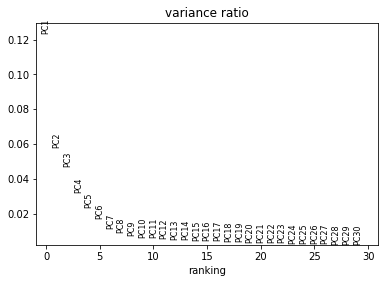

In [6]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata)

In [7]:
# Select number of PCs to use
N_PCS = 8

Compare different embeddings based on previously defined annotation. 

In [8]:
sc.pp.neighbors(adata,n_pcs = N_PCS) 
sc.tl.umap(adata)

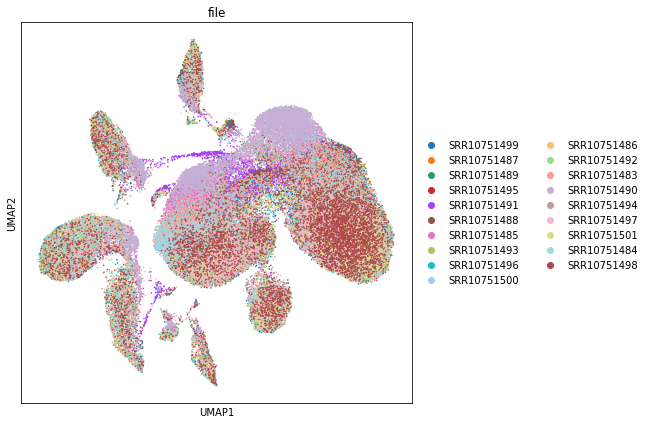

In [9]:
rcParams['figure.figsize'] = (7, 7)
sc.pl.umap(adata, size=10, color=['file'])

#### On scaled data

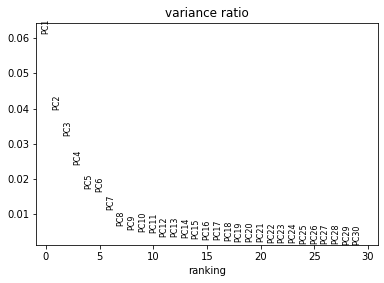

In [10]:
# Scale data and perform PCA
adata_scl = adata.copy()
adata_scl.X = sparse.csr_matrix(adata_scl.X)
sc.pp.scale(adata_scl, max_value=10)
sc.pp.pca(adata_scl, n_comps=30, use_highly_variable=True, svd_solver='arpack')
rcParams['figure.figsize'] = (6, 4)
sc.pl.pca_variance_ratio(adata_scl)

In [11]:
#C: Can stay the same as above
N_PCS

8

In [12]:
# neighbours on scaled data
sc.pp.neighbors(adata_scl,n_pcs = 7) 

In [13]:
# Umap on scaled data
sc.tl.umap(adata_scl)

In [14]:
# Add scaled embedding to adata
adata.obsm['X_umap_scl'] = adata_scl.obsm['X_umap']

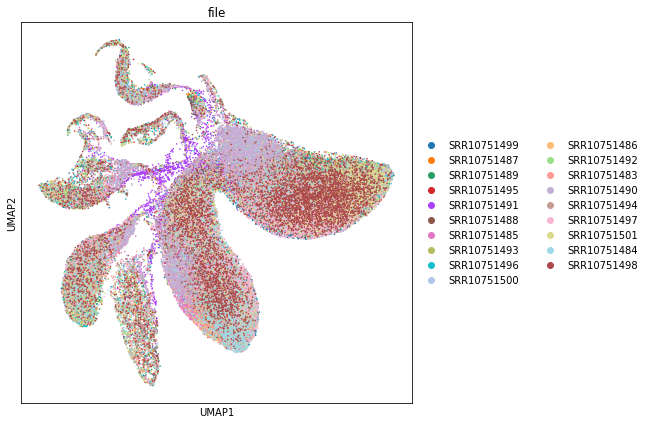

In [15]:
rcParams['figure.figsize'] = (7,7)
sc.pl.umap(adata_scl, size=10, color=['file'])

## Cell cycle
Performed separately for individual batches.

No proliferative cell clusters are detectable.
Barely any cells seem to be proliferative.
This is to be expected in an adult pancreas.

Cyclone has been commented out for faster runtime/less memory usage.

 ### Cyclone - based on G1, S, and G2/M scores

Add gene Entrez IDs to adata in order to map genes to cell cycle database.

In [15]:
# Count of cells annotated to each phase
cyclone_anno.phase_cyclone.value_counts()

G1     84057
S      11638
G2M     2162
Name: phase_cyclone, dtype: int64

In [ ]:
# Add cyclone annotation to adata
cyclone_anno = cyclone_anno.reindex(adata.obs.index)
adata.obs = pd.concat([adata.obs,cyclone_anno], axis=1)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'phase_cyclone' as categorical


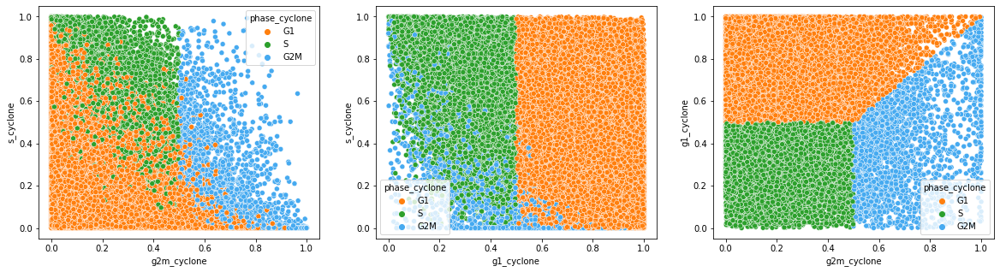

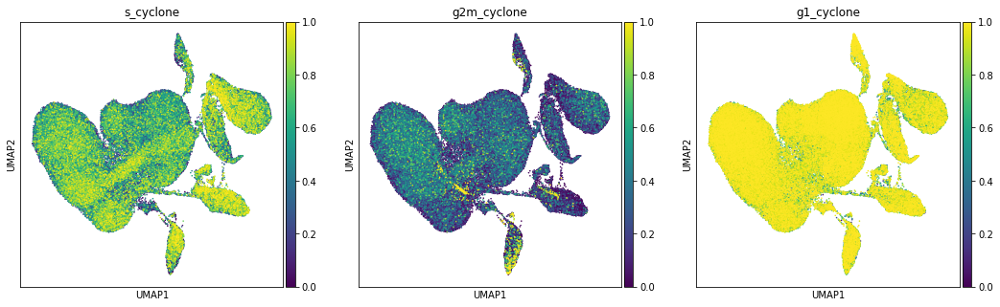

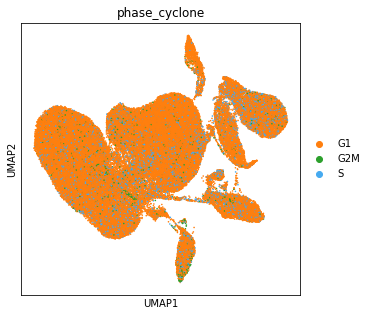

In [18]:
# Plot score distributions and cell assignment on UMAP
rcParams['figure.figsize'] = (20,5)
fig,axs = plt.subplots(1, 3)
palette = sb.color_palette(['#ff7f0e', '#2ca02c', '#46aaf0'])
sb.scatterplot(x='g2m_cyclone', y='s_cyclone', hue='phase_cyclone', data=cyclone_anno, ax=axs[0], palette=palette)
sb.scatterplot(x='g1_cyclone', y='s_cyclone', hue='phase_cyclone', data=cyclone_anno, ax=axs[1], palette=palette)
sb.scatterplot(x='g2m_cyclone', y='g1_cyclone', hue='phase_cyclone', data=cyclone_anno, ax=axs[2], palette=palette)
rcParams['figure.figsize'] = (5,5)
sc.pl.umap(adata, color=['s_cyclone', 'g2m_cyclone', 'g1_cyclone'], size=10, use_raw=False)
adata.uns['phase_cyclone_colors'] = ['#ff7f0e', '#2ca02c', '#46aaf0']
sc.pl.umap(adata, color=['phase_cyclone'], size=10, use_raw=False)

MKI67 expression for comparison with cell cycle anno:

In [16]:
print('MKI67 in adata:', sum(adata.var.index == 'MKI67'))
print('MKI67 in adata_raw (only gene expression filtering):', sum(adata.raw.var.index == 'MKI67'))
print('MKI67 in cellranger data:', features_f.query('gene_symbol_adata == "MKI67"').shape[0])

MKI67 in adata: 1
MKI67 in adata_raw (only gene expression filtering): 1
MKI67 in cellranger data: 1


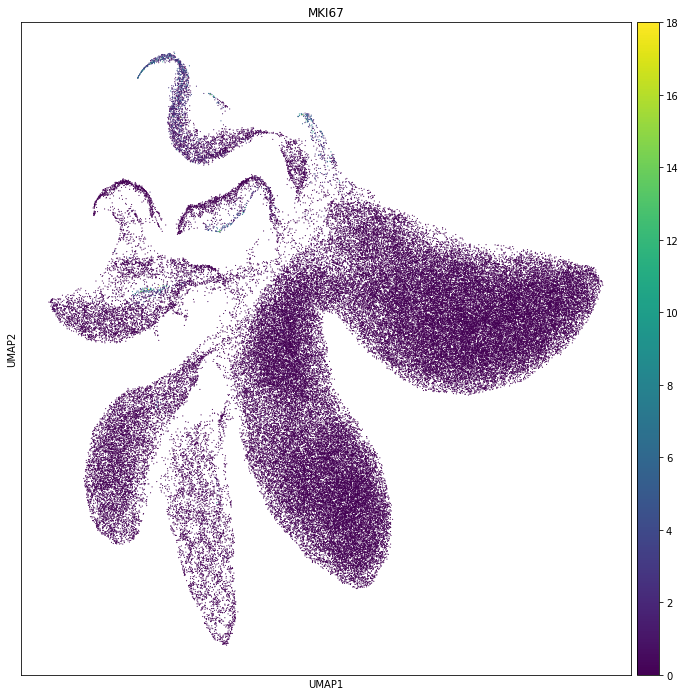

Amount of cells MKI67 is expressed in: 2460
Total amount of cells: 97857


In [20]:
rcParams['figure.figsize'] = (12, 12)
sc.pl.umap(adata_scl, color='MKI67' ,size=5, use_raw=True)
print('Amount of cells MKI67 is expressed in:', adata.var.loc['MKI67']['n_cells'])
print('Total amount of cells:', adata_scl.X.shape[0])

## Save intermediate results before cell type annotation

# Cell type annotation

In [17]:
# adata = h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)
# adata = sc.read(shared_folder+"data_annotated.h5ad")
# adata = pickle.load(open(shared_folder + 'data_annotated.pkl', 'rb'))
# adata = pickle.load(open(shared_folder + 'data_normalised.pkl', 'rb'))
adata

AnnData object with n_obs × n_vars = 97857 × 16263
    obs: 'file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter', 'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet', 'doublet_score_filter', 'size_factors'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'EID'
    uns: 'doublet_score_filter_colors', 'file_colors', 'hvg', 'mt_frac_filter_colors', 'n_counts_filter_colors', 'n_genes_filter_colors', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_umap_scl'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

## Endo high annotation

In [18]:
# Normalise raw data for cell type scoring
adata_rawnorm = adata.raw.to_adata().copy()
adata_rawnorm.X /= adata.obs['size_factors'].values[:, None] # This reshapes the size-factors array
sc.pp.log1p(adata_rawnorm)
adata_rawnorm.X = np.asarray(adata_rawnorm.X)
adata_rawnorm.obs = adata.obs.copy()

#### Ins

In [19]:
"INS" in adata_rawnorm.var_names

True

#### Gcg

#### SSt

#### Ppy

#### Ghrl

#### Save

## All cell types

## Clustering

#### Leiden clustering on log transformed data.

In [20]:
adata

AnnData object with n_obs × n_vars = 97857 × 16263
    obs: 'file', 'n_counts', 'n_genes', 'mt_frac', 'n_counts_filter', 'n_genes_filter', 'mt_frac_filter', 'doublet_score', 'doublet', 'doublet_score_filter', 'size_factors'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'EID'
    uns: 'doublet_score_filter_colors', 'file_colors', 'hvg', 'mt_frac_filter_colors', 'n_counts_filter_colors', 'n_genes_filter_colors', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_umap_scl'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [21]:
# Clustering resolution
res = 0.1

In [22]:
sc.tl.leiden(adata, resolution=res)

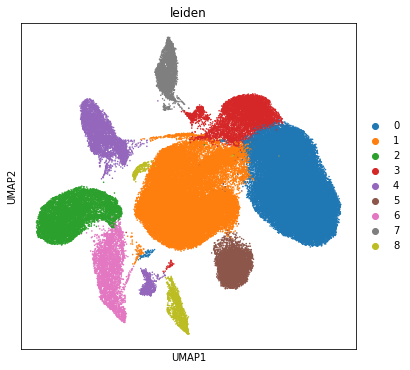

In [23]:
rcParams['figure.figsize'] = (6, 6)
sc.pl.umap(adata, color=['leiden'], size=10, use_raw=False)

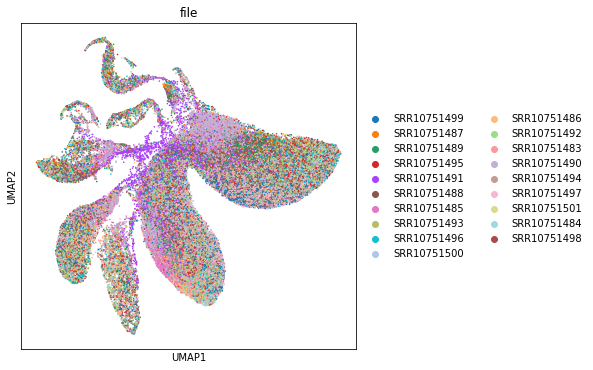

In [24]:
#del adata_scl.uns['sex_colors']
rcParams['figure.figsize'] = (6, 6)
random_indices = np.random.permutation(list(range(adata_scl.shape[0])))
# sc.pl.umap(adata_scl[random_indices, :], color=['file', 'phase_cyclone'], size=10, use_raw=False, wspace=0.3, sort_order=False)
sc.pl.umap(adata_scl[random_indices, :], color=['file'], size=10, use_raw=False, wspace=0.3, sort_order=False)

In [25]:
# Cluster scaled data
sc.tl.leiden(adata_scl, resolution=res, key_added='leiden_scaled_r' + str(res), directed=True, use_weights=True)

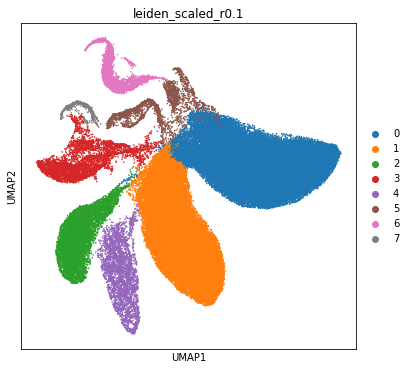

In [26]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize'] = (6, 6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r' + str(res)], size=10, use_raw=False)

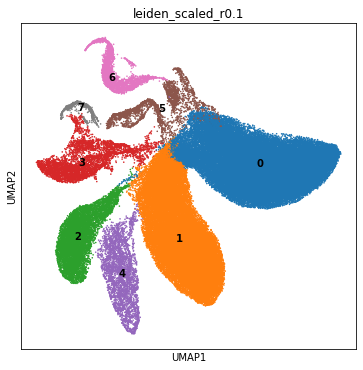

In [27]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize'] = (6, 6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r' + str(res)], size=10, use_raw=False, legend_loc='on data')

#C: Umaps and clusterings on z-scaled data and non-z-scaled data perform similarly. z-scaled data will be used for consistency with other analysed studies.

## Cell type annotation

In [28]:
# Normalise raw data for plotting and cell type scoring
adata_raw = adata_scl.raw.to_adata().copy()
sc.pp.normalize_total(adata_raw, target_sum=1e4, exclude_highly_expressed=True, inplace=False)
sc.pp.log1p(adata_raw)
adata_rawnormalised = adata_scl#.copy()
adata_rawnormalised.raw = adata_raw
del adata_raw

In [29]:
# Markers data
marker_data = pd.read_excel('/dss/dsshome1/lxc07/gobi009/hafner/code/marker_genes_collection.xlsx',
             sheet_name='Collection table')

In [30]:
# Load orthologues so that mice markers can be also checked out
orthologues = pd.read_table('/dss/dsshome1/lxc07/gobi009/hafner/code/orthologues_ORGmus_musculus_ORG2homo_sapiens_V103.tsv')

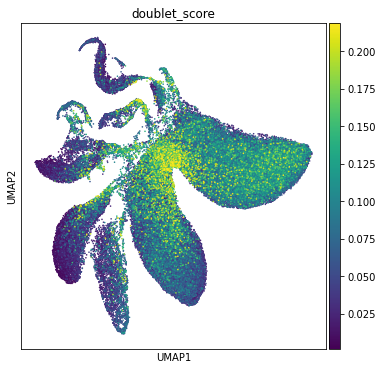

In [31]:
# Plot doublet score
sc.pl.umap(adata_rawnormalised, color='doublet_score', size=10, use_raw=True)

C: It seems that some doublets may be present

('B cell', 'NA')
Missing genes: []


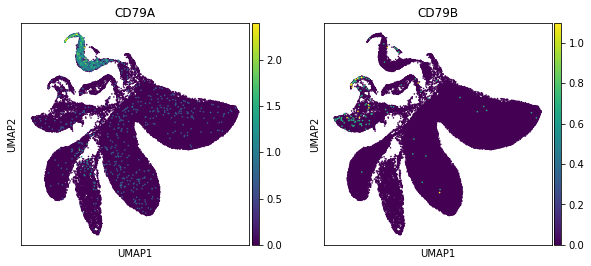

('Schwann cell', 'NA')
Missing genes: ['CMTM5']


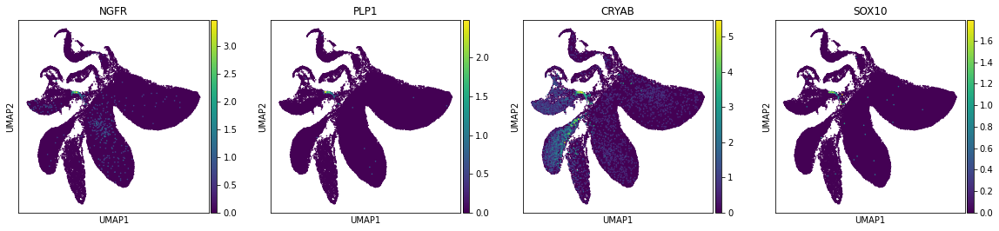

('T cell', 'NA')
Missing genes: []


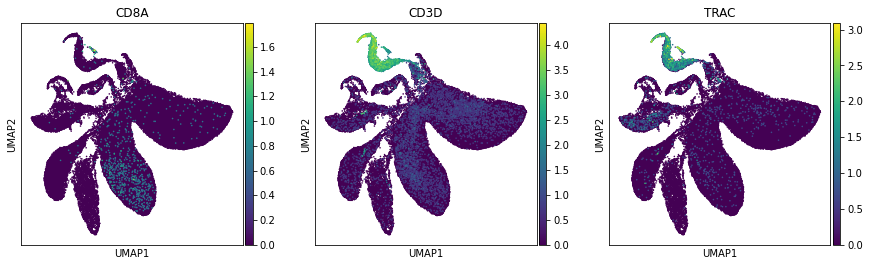

('cytotoxic T cell', 'NA')
Missing genes: []


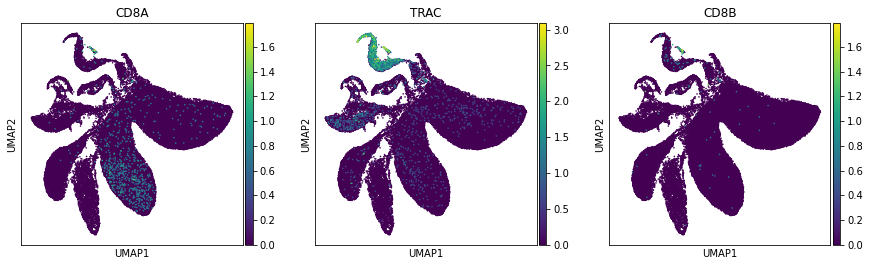

('dendritic cell', 'NA')
Missing genes: ['AC136475.9']


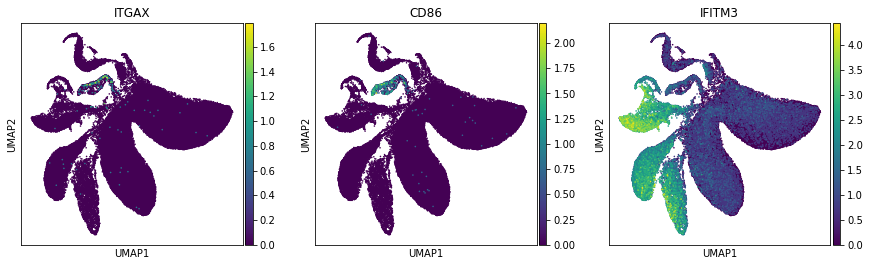

('endothelial cell', 'NA')
Missing genes: []


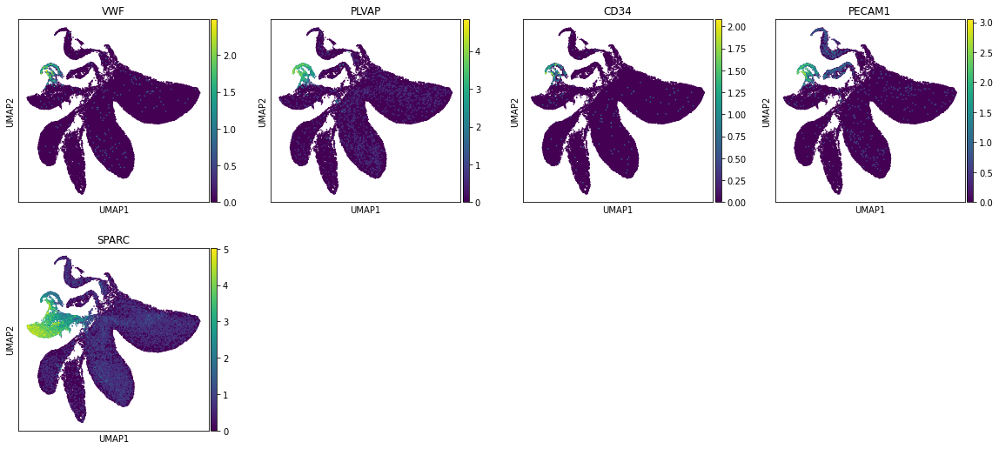

('fibroblast', 'NA')
Missing genes: []


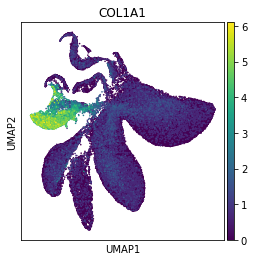

('leukocyte', 'NA')
Missing genes: []


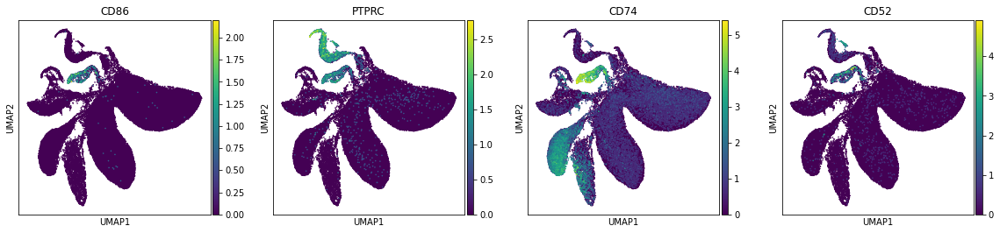

('macrophage', 'NA')
Missing genes: []


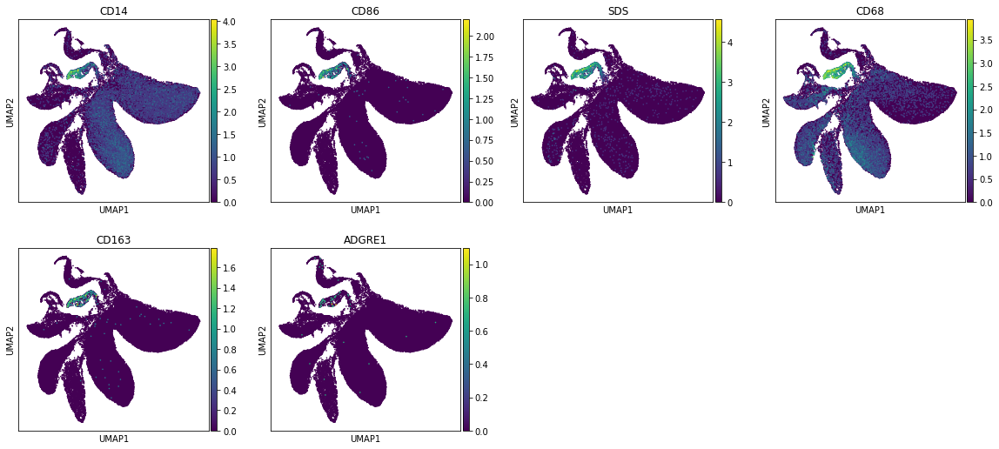

('mast cell', 'NA')
Missing genes: []


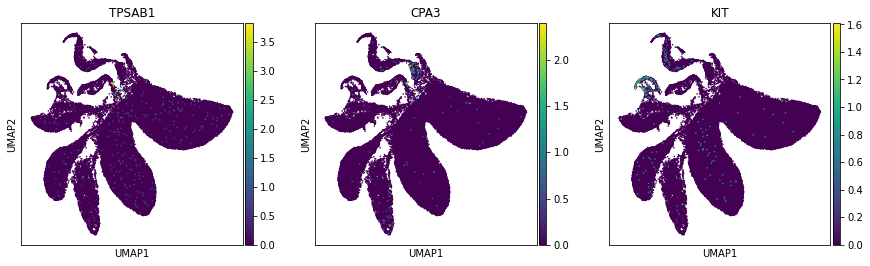

('pancreatic A cell', 'NA')
Missing genes: []


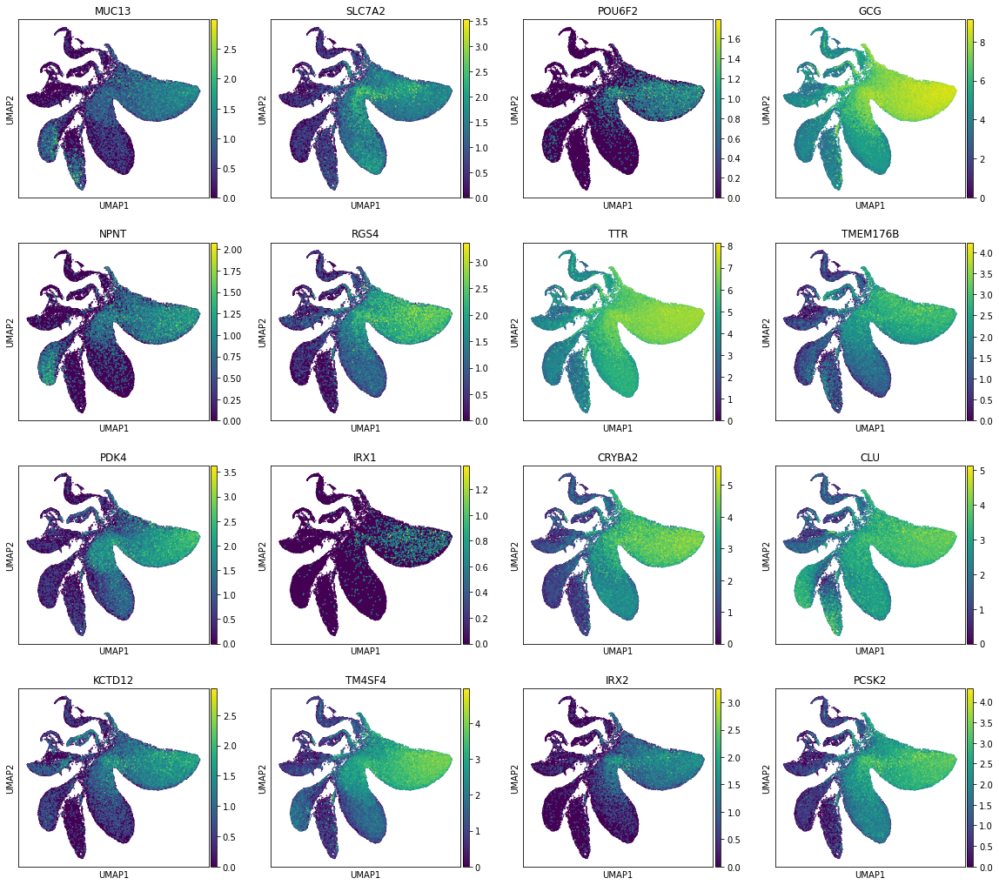

('pancreatic D cell', 'NA')
Missing genes: ['NEUROG3']


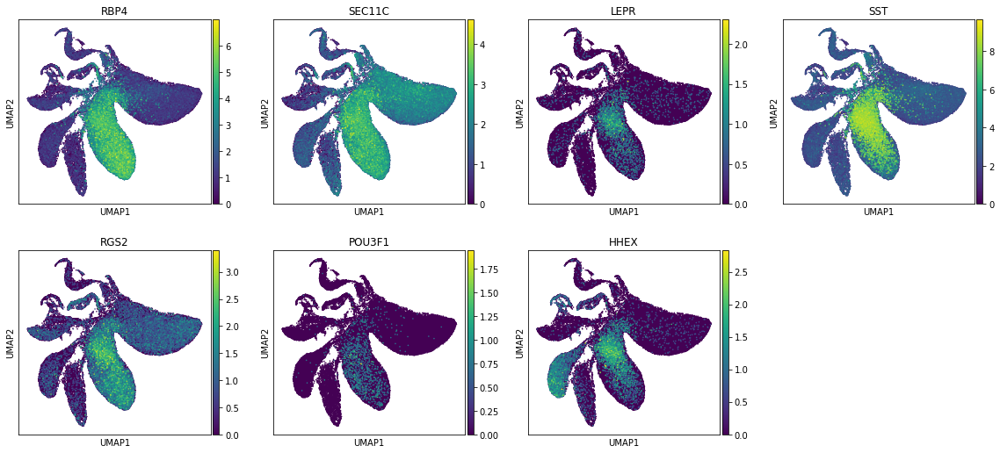

('pancreatic PP cell', 'NA')
Missing genes: []


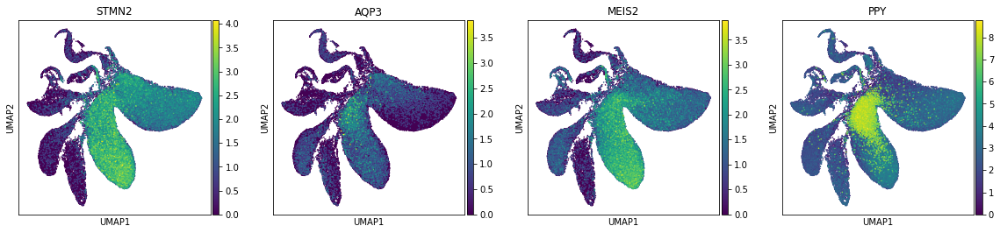

('pancreatic acinar cell', 'NA')
Missing genes: []


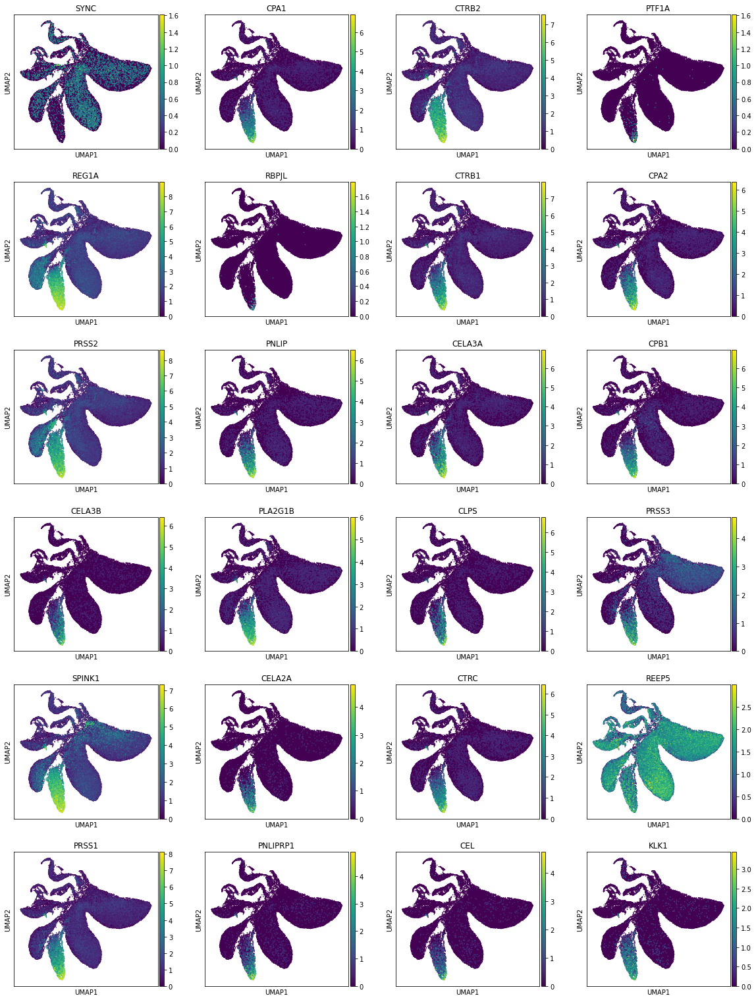

('pancreatic ductal cell', 'NA')
Missing genes: []


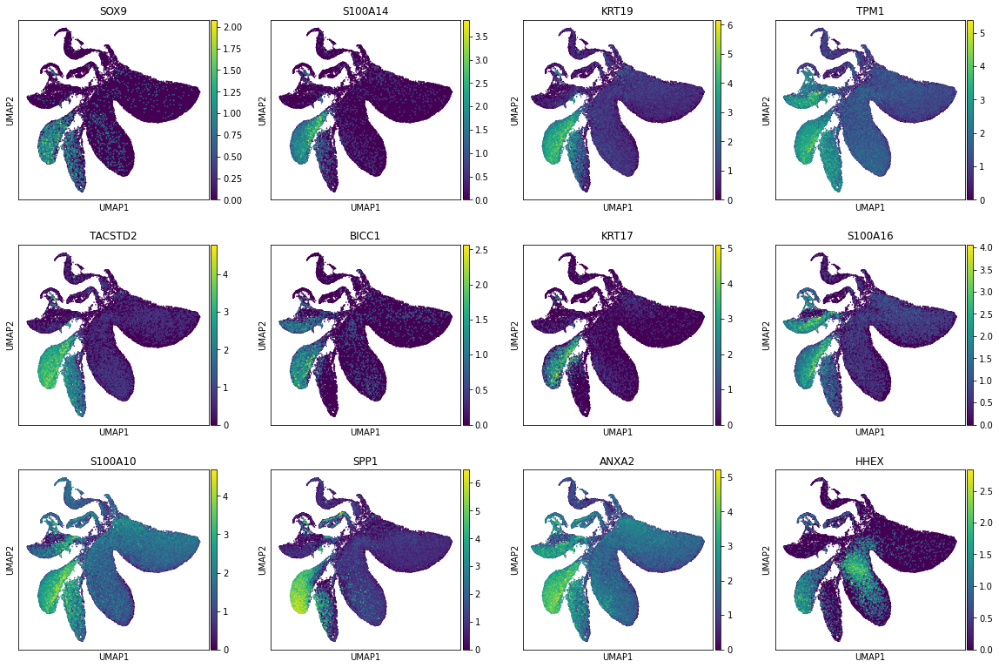

('pancreatic ductal cell', 'mature')
Missing genes: []


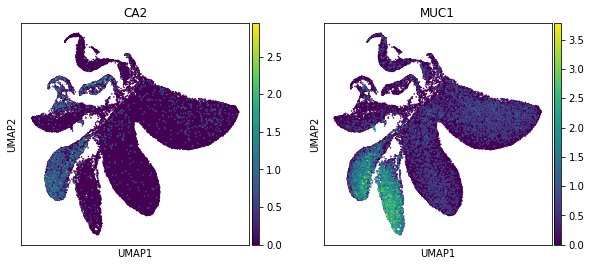

('pancreatic endocrine cell', 'NA')
Missing genes: []


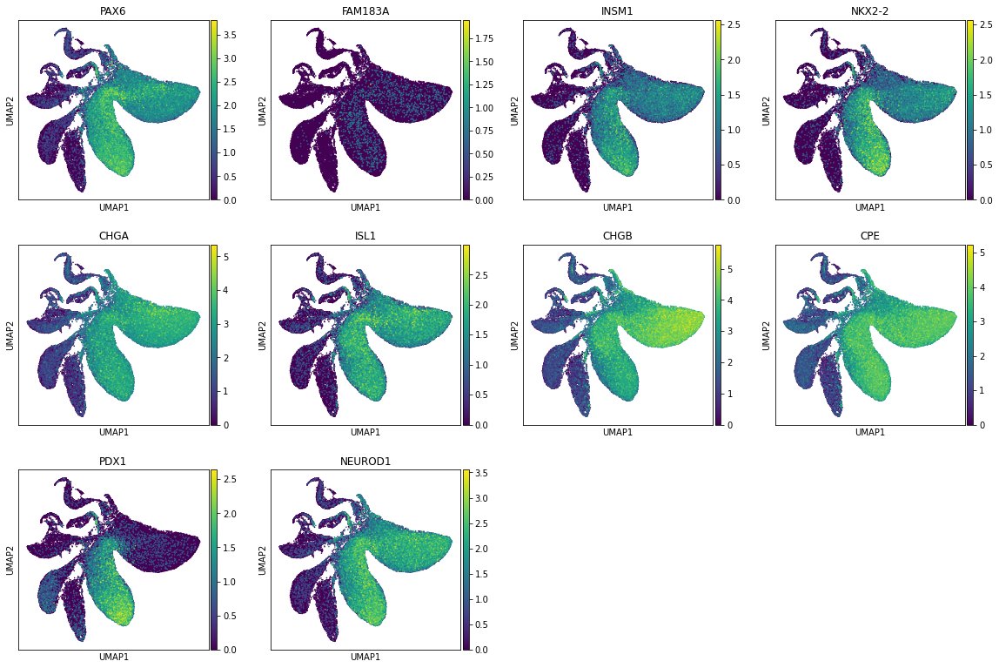

('pancreatic epsilon cell', 'NA')
Missing genes: []


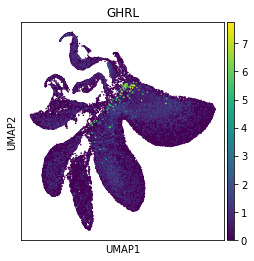

('pancreatic stellate cell', 'NA')
Missing genes: []


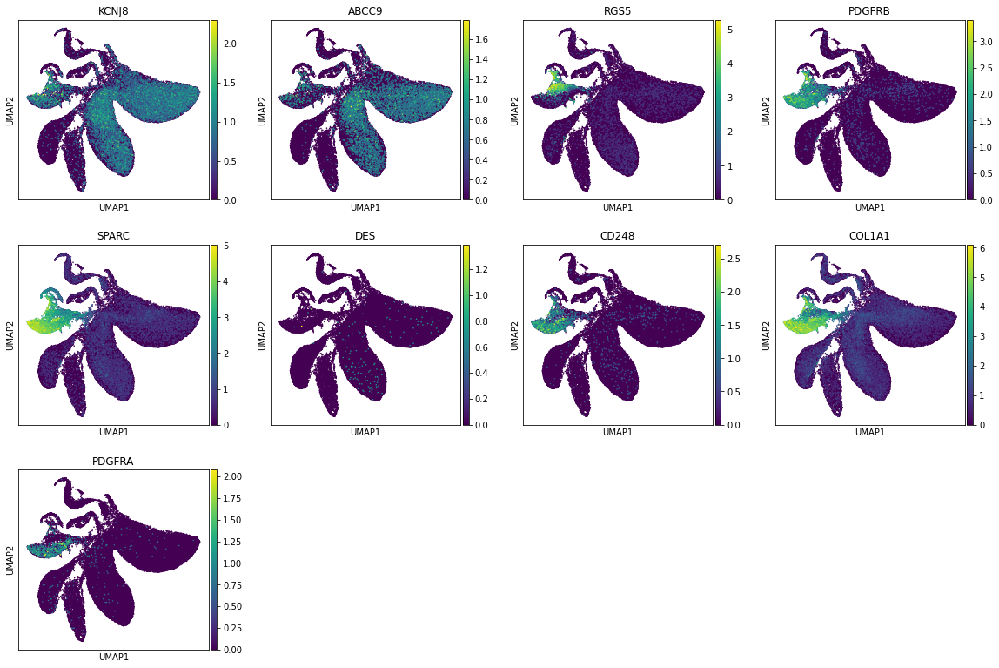

('pancreatic stellate cell', 'activated')
Missing genes: []


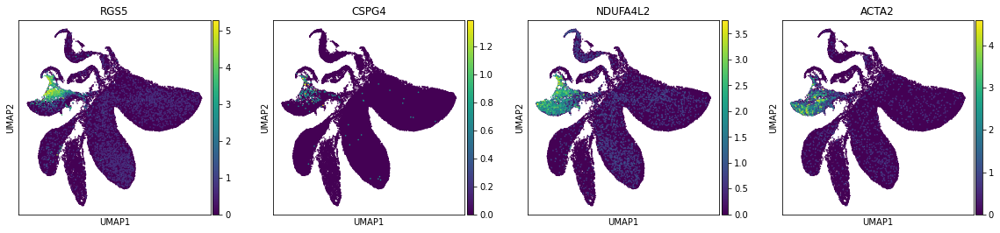

('pancreatic stellate cell', 'quiescent')
Missing genes: []


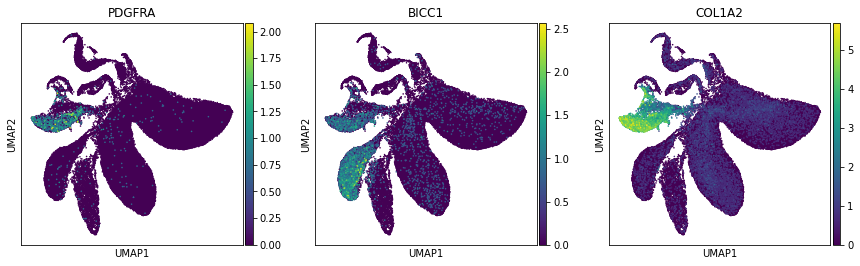

('progenitor cell of endocrine pancreas', 'NA')
Missing genes: []


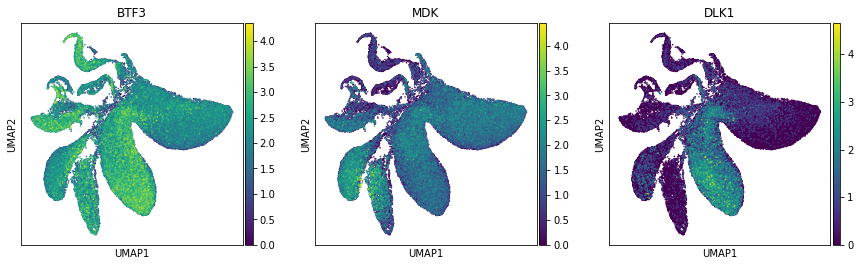

('type B pancreatic cell', 'ER stress')
Missing genes: []


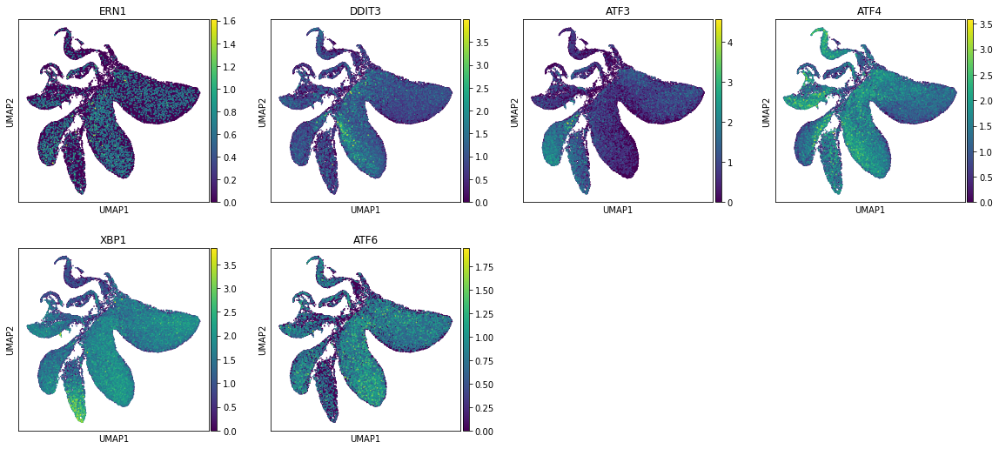

('type B pancreatic cell', 'NA')
Missing genes: []


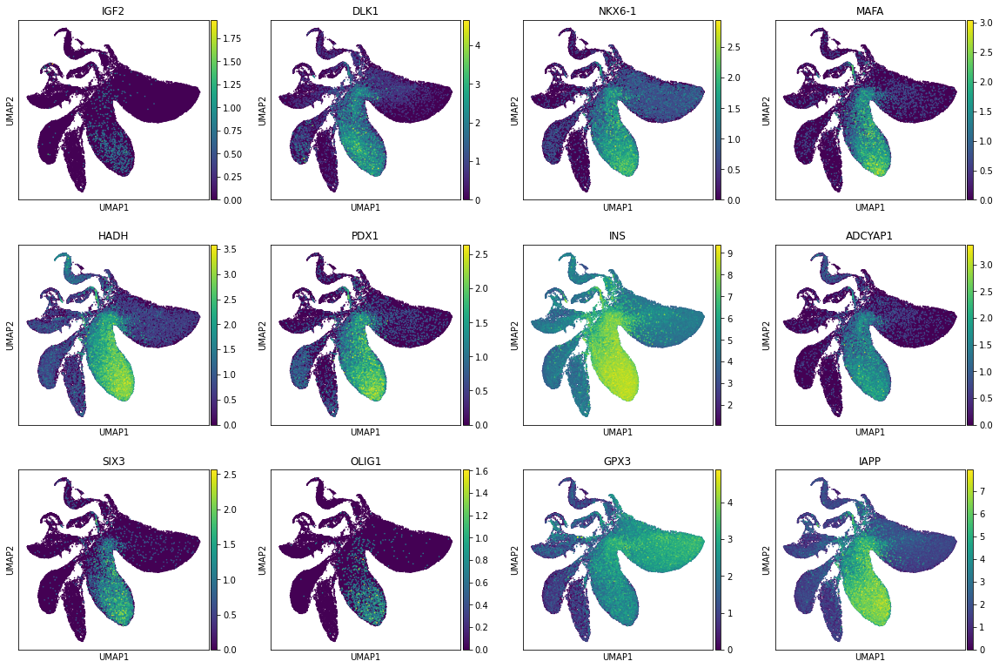

('type B pancreatic cell', 'aging')
Missing genes: []


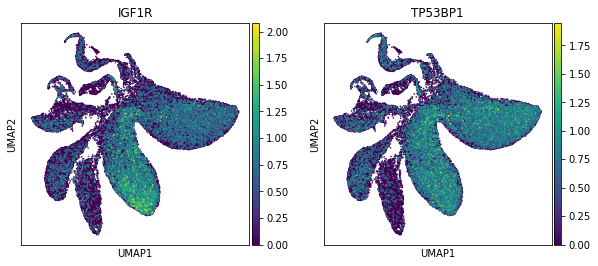

('type B pancreatic cell', 'dedifferentiated')
Missing genes: []


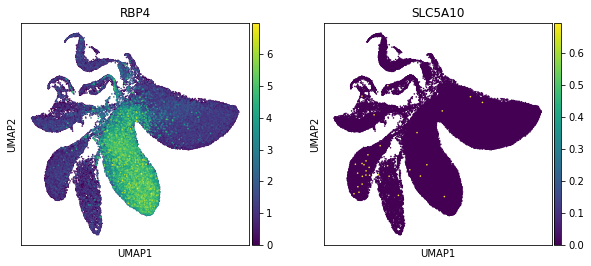

('type B pancreatic cell', 'immature')
Missing genes: []


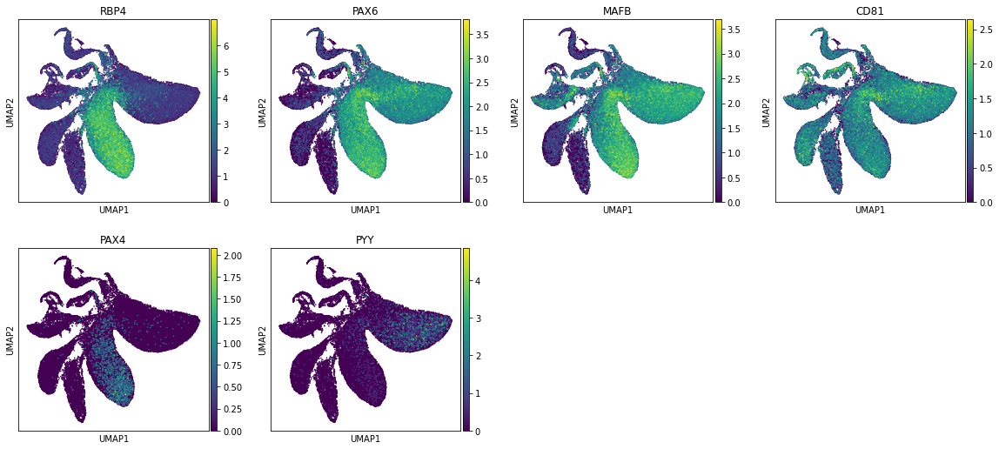

('type B pancreatic cell', 'inflamation')
Missing genes: []


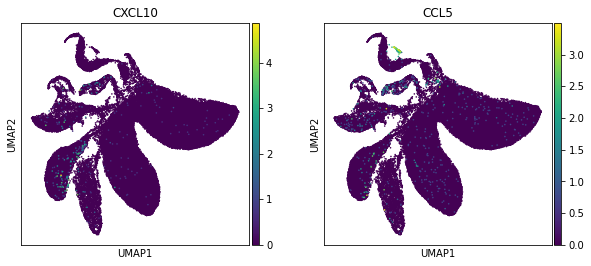

('type B pancreatic cell', 'mature')
Missing genes: []


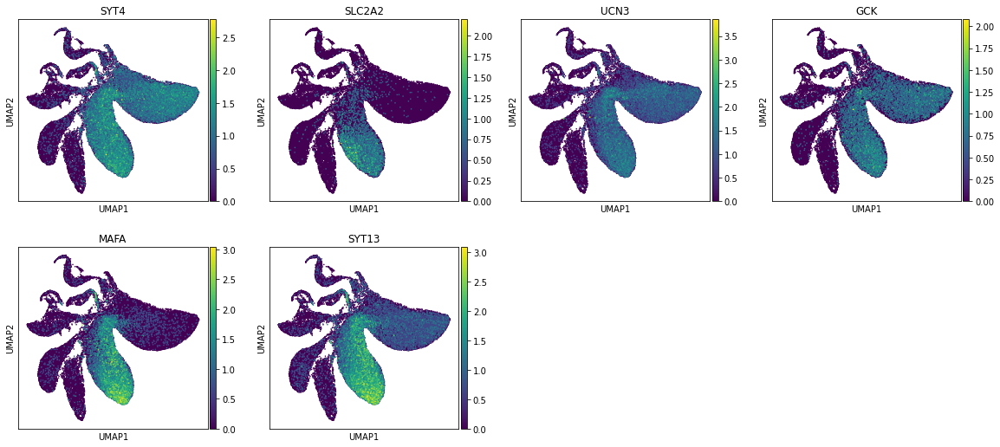

('type B pancreatic cell', 'senescent')
Missing genes: []


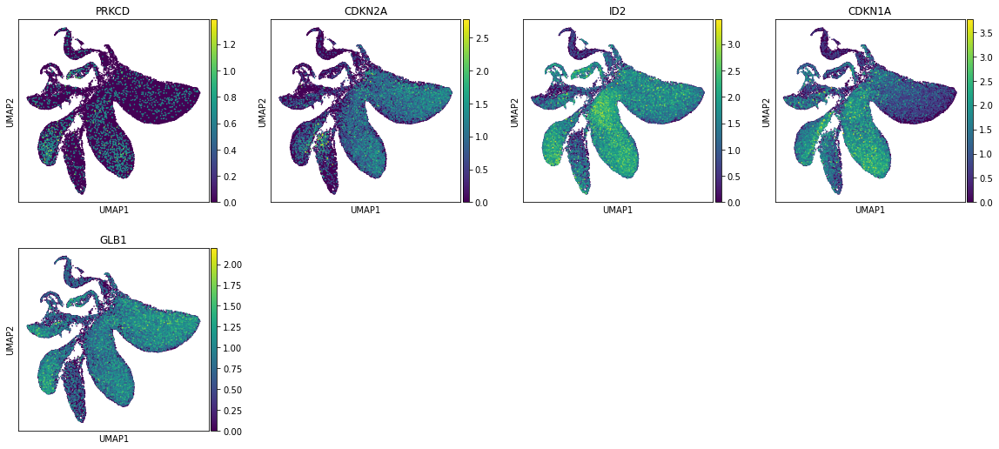

In [32]:
# Plot markers for each cell type
# Fillna as else groupby item iteration does not work well
marker_groups = marker_data.fillna('NA').query('tissue == "pancreas"').groupby(['cell_type', 'subtype'])
for cell_type,data in marker_groups:
    print(cell_type)
    # For mouse subset to markers that worked
    genes_mouse = set(data.query('worked == worked & organism == "Mus musculus"').gene_name) # worked==worked removes nan values
    genes_mouse_orthologues = set(orthologues[orthologues['Gene name'].isin(genes_mouse)]['Human gene name'])
    # For mouse also use just upper case representation
    # But exclude those that are not in adata from the start as they amy not be valid human genes
    genes_mouse_upper = set([gene.upper() for gene in genes_mouse if  gene.upper() in adata.var_names])
    # Human gene markers
    genes_human = set(data.query('organism == "Homo sapiens"').gene_name) 
    # Combination of all markers
    genes = genes_human | genes_mouse_upper | genes_mouse_orthologues
    # Retain genes present in raw var_names
    missing = [gene for gene in genes if gene not in adata.raw.var_names]
    genes = [gene for gene in genes if gene in adata.raw.var_names]
    if len(genes) > 0:
        print('Missing genes:', missing)
        rcParams['figure.figsize'] = (4, 4)
        #sc.pl.umap(adata_rawnormalised, color=['pre_cell_type'],size=10, use_raw=True)
        sc.pl.umap(adata_rawnormalised, color=genes, size=10, use_raw=True)
    else:
        print('No availiable genes (out of:', missing, ')\n')

In [33]:
# Selected markers that seem to be able to distinguish between cell types
# Use only hormone genes for endocrine cells
markers_selection = {
    'schwann': ['SOX10', 'PLP1'],
    'endothelial': ['PECAM1', 'PLVAP'],
    'immune': ['PTPRC'],
    'alpha': ['GCG'], # Also others
    'delta': ['SST', 'HHEX', 'RGS2'],
    'gamma': ['PPY'],
    # Also many other acinar marker genes
    'acinar': ['CELA2A', 'KLK1', 'CPB1', 'PNLIP', 'CPA1', 'CELA3B', 'CPA2', 'PNLIPRP1', 'CEL',  # old
              'CTRB1', 'PRSS2', 'CTRB2', 'REG1A'],
    'ductal': ['S100A14', 'S100A10', 'ANXA2', 'KRT19', 'TACSTD2', 'SPP1'], # S100 is old, maybe remove?
    'epsilon': ['GHRL'],
    'stellate_activated': ['RGS5', 'ACTA2', 'NDUFA4L2'],
    'stellate_quiescent': ['PDGFRA', 'COL1A2', 'BICC1', 'PDGFRA'],
    'beta': ['INS', 'IAPP'], #Also others
}

### Marker expression scores
Score each cell for marker expression of each cell type. Cells can thus be annotated qith 0 to N cell types. The presence of annotations is then checked for each cluster.

In [34]:
#Score cells for each cell type

# Save score column names 
scores = []
for cell_type, genes in markers_selection.items():
    score_name = cell_type + '_score'
    scores.append(cell_type + '_score')
    sc.tl.score_genes(adata_rawnormalised, gene_list=genes, score_name=score_name, use_raw=True)

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will rai

In [35]:
# Which clusters (column name) to analyse for cell scores
res = 0.1
clusters_col = 'leiden_scaled_r' + str(res)

In [36]:
# Add cluster information to the used adata
adata_rawnormalised.obs[clusters_col] = adata_scl.obs[clusters_col].copy()

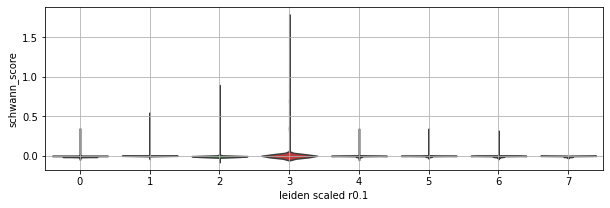

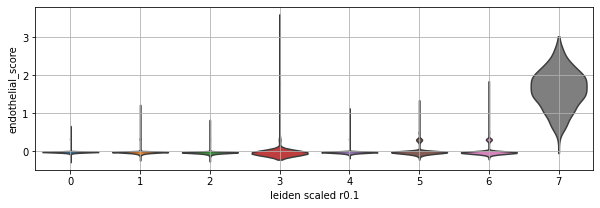

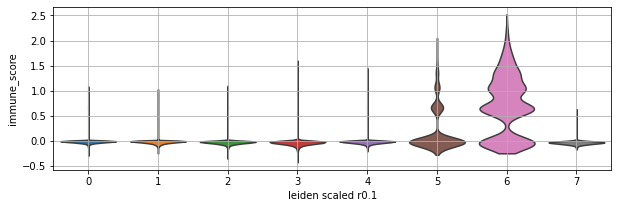

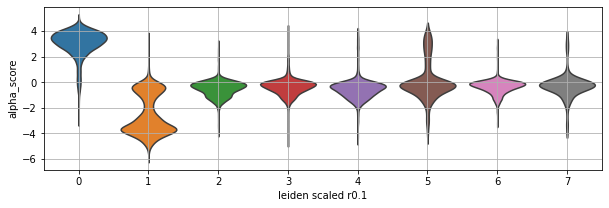

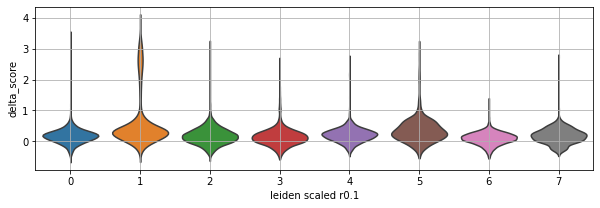

...

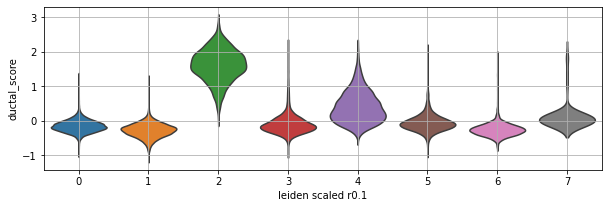

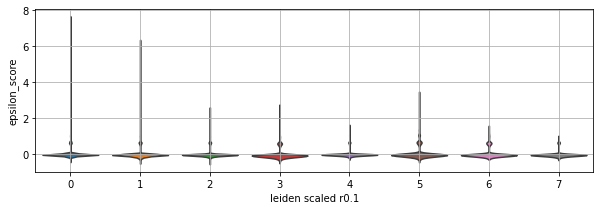

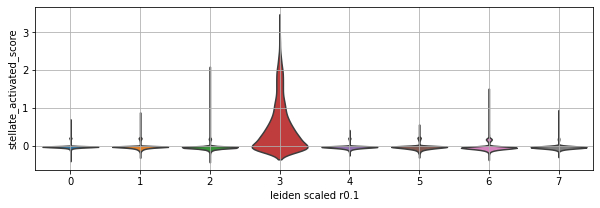

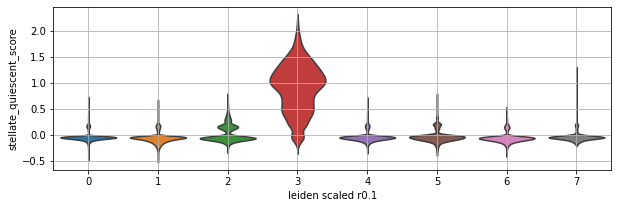

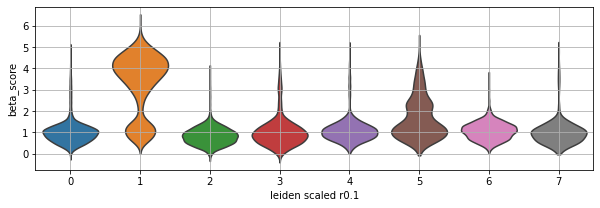

In [37]:
# Plot scores distribution across clusters
rcParams['figure.figsize']=(10,3)
for score in scores:
    fig, ax = plt.subplots()
    sc.pl.violin(adata_rawnormalised, keys=score, groupby=clusters_col, use_raw=True, stripplot=False, ax=ax, show=False)
    ax.grid()

In [38]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df = adata_rawnormalised.obs[scores]
# Do not use normalisation so that it is more comparable to above
# scores_df_norm = pd.DataFrame(pp.minmax_scale(scores_df_norm), columns=scores_df_norm.columns, index=adata_rawnormalised.obs.index)

In [39]:
thresholds_map = {
    'schwann_score': 0.2,
    'endothelial_score': 0.1,
    'immune_score': 0.3,
    'alpha_score': 1,
    'beta_score': 2,
    'delta_score': 1.5,
    'gamma_score': 4,
    'acinar_score': 0.5,
    'ductal_score': 1,
    'epsilon_score': 2.5,
    'stellate_activated_score': 1,
    'stellate_quiescent_score': 0.7
}

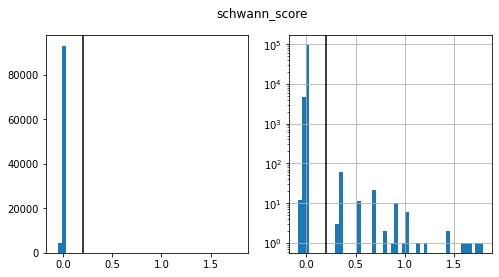

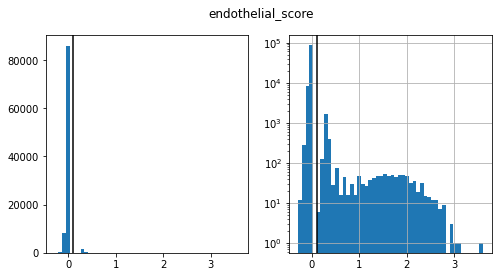

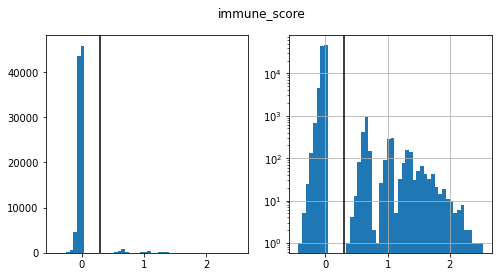

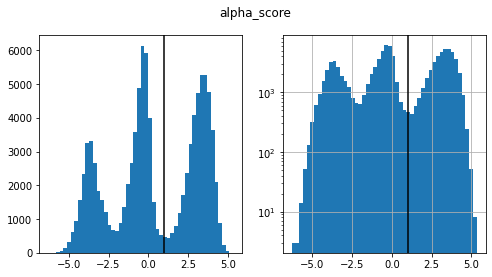

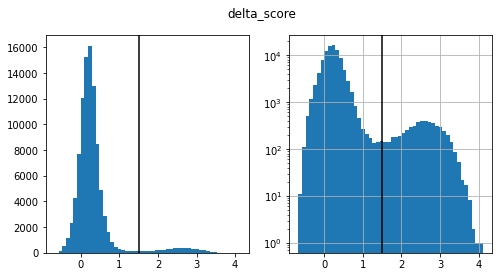

...

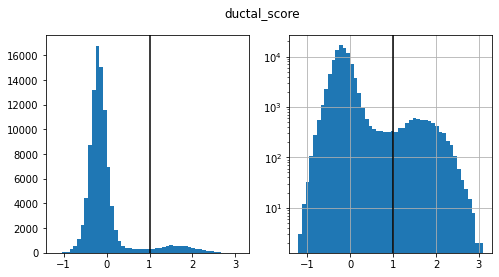

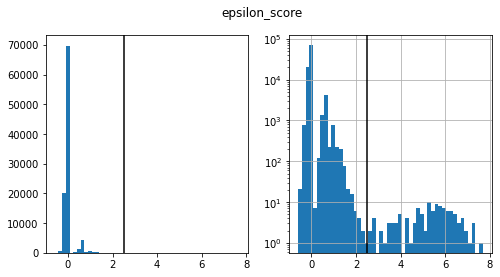

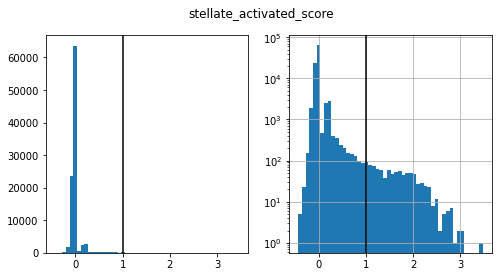

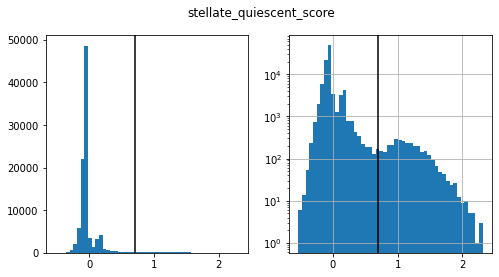

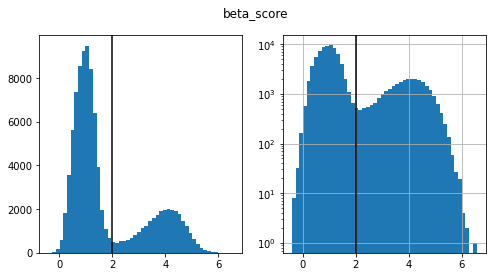

In [40]:
# Distn of scores across all cells to account for different N of cells across clusters
for score in scores_df.columns:
    thr = thresholds_map[score]
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))
    ax[0].hist(scores_df[score], bins=50)
    ax[1].hist(scores_df[score], bins=50)
    fig.suptitle(score)
    ax[1].set_yscale('log')
    ax[1].grid()
    ax[0].axvline(thr, c='k')
    ax[1].axvline(thr, c='k')

In [41]:
# Thresholds for cell type assignemnt based on normalised scores
thresholds = scores_df.columns.map(thresholds_map)

In [42]:
# Assign cell types based on scores to each cell
assignment_df = scores_df >= thresholds
assignment_df.columns = [col.replace('_score', '') for col in scores_df.columns]

In [43]:
# Count of cells per cell type
assignment_df[[col.replace('_score', '') for col in scores_df.columns]].sum()

schwann                 125
endothelial            3189
immune                 3083
alpha                 41602
delta                  5202
gamma                  5148
acinar                 3457
ductal                 7171
epsilon                 117
stellate_activated      927
stellate_quiescent     3246
beta                  28754
dtype: int64

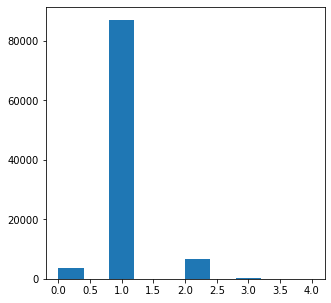

In [44]:
# How many cell types were annotated to each cell
rcParams['figure.figsize'] = (5, 5)
a = plt.hist(assignment_df.sum(axis=1))

In [45]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions = []
for idx, row in assignment_df.iterrows():
    type_union = ''
    for col in sorted(row.index):
        if row[col]:
            type_union = type_union + col + '_'
    if type_union == '':
        type_union = 'NA'
    type_unions.append(type_union.rstrip('_'))

In [46]:
# Add cell types strings of cells to scores/assignment DF
assignment_df['type_union'] = type_unions
assignment_df[clusters_col] = adata_rawnormalised.obs[clusters_col].values

### Annotate clusters

In [47]:
# Make DF of marker gene expressions (normalised, log transformed), scaled for each gene to [0,1]
used_markers = list(dict.fromkeys([marker for marker_list in markers_selection.values() for marker in marker_list]))
gene_idx = adata_rawnormalised.raw.var_names.isin(used_markers)
genes = adata_rawnormalised.raw.var_names[gene_idx]
scaled_expression = pd.DataFrame(pp.minmax_scale(adata_rawnormalised.raw.X.toarray()[:, gene_idx]), columns=genes,index=adata_rawnormalised.obs.index)[[marker for marker in used_markers if marker in genes]]

In [48]:
def add_category(df, idxs, col, category):
    """
    Add single value to multiple rows of DF column (useful when column might be categorical). 
    If column is categorical the value is beforehand added in the list of present categories 
    (required for categorical columns). 
    :param df: DF to which to add values
    :param idxs: Index names of rows where the value should be assigned to the column.
    :param col: Column to which to add the value.
    :param category: The value to add to rows,column.
    """
    # If column is already present, is categorical and value is not in categories add the value to categories first.
    if col in df.columns and df[col].dtype.name == 'category' and category not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories([category])
    df.loc[idxs, col] = category

In [49]:
def subcluster(adata_cluster, res, original_cluster, assignment_df_temp, clusters_name_prefix='leiden_scaled_r'):
    """
    Cluster adata and add reult into cell type assignment DF. Plot the clustering on UMAP.
    Add name of the original cluster to which the adata belongs to new cluster names.
    Cluster column name: clusters_name_prefix+str(res) 
    :param adata_cluster: Adata (with already computed neighbours and UMAP) to cluster with leiden clustering. 
    :param res: Leiden resolution
    :param original_cluster: Original cluster name, new clusters are named 'original cluster'+'_'+'new cluster'
    :param assignment_df_temp: assignment_df to which to add clusters - should have same row order as adata
    :param clusters_name_prefix: Prefix for cluster column name.
    """
    clusters_col_name = clusters_name_prefix + str(res)
    sc.tl.leiden(adata_cluster, resolution=res, key_added=clusters_col_name, directed=True, use_weights=True)
    adata_cluster.obs[clusters_col_name] = [original_cluster + '_' + subcluster for subcluster in adata_cluster.obs[clusters_col_name]]
    sc.pl.umap(adata_cluster, color=clusters_col_name)
    time.sleep(1.0)
    
    assignment_df_temp['leiden_scaled_r' + str(res)] = adata_cluster.obs['leiden_scaled_r' + str(res)].values
    
def get_cluster_data(adata_original, cluster, cluster_col, assignment_df):
    """
    Subset adata and assignment_df to cluster.
    :param adata_original: Adata to subset.
    :param  cluster: Cluster for which to extract the data.
    :param cluster_col: Column where clusters are listed. Should be present in adata and assignment_df.
    :param assignment_df: DF with cell type assignmnets in column 'type_union' and cluster info. Should have index names
    that are present in adata.obs.index.
    :return: Subset of adata, assignment_df
    """
    adata_temp = adata_original[adata_original.obs[cluster_col] == cluster].copy()
    assignment_df_temp = pd.DataFrame(assignment_df.loc[adata_temp.obs.index, 'type_union'])
    return adata_temp, assignment_df_temp

def cluster_annotate(assignment_df, cluster_col, present_threshold, nomain_threshold, save, cluster_annotation, adata_main):
    """
    Loop through clusters, check present cell types and if there is no main cell type plot expression and QC metrics.
    For each cluster list proportion of present cell types.
    Expression (normalised, log transformed, [0,1] per gene scaled) is plotted for marker genes across cells (heatmap).
    QC metrics are plotted as scatterplot of N genes and N counts with cluster cells overlayed over all cels.
    :param assignment_df: DF with cell type assignment in column 'type_union' and cluster assignment.
    :param cluster_col: Cluster column name in assignment_df.
    :param present_threshold: Count among present cell types each cell type present if it represents 
    at least present_threshold proportion of cells in cluster. 
    :param nomain_threshold: If only 1 cell type was selected with present_threshold and 
    no cell type is present at proportion at least nomain_threshold add 'other' to annotated cell types list.
    :param save: Save cluster information to adata_main (column 'cluster') and cell types list to cluster_annotation.
    :param cluster_annotation: Dict where each cluster (key) has list of annotated cell types (value).
    :param adata_main: Add cluster to adata_main.obs.cluster. Use this adata for plotting of QC mettrics (for this a
    column 'temp_selected' is added.)
    """
    for group in assignment_df[['type_union', cluster_col]].groupby(cluster_col):
        types_summary = group[1].type_union.value_counts(normalize=True)
        present = list(types_summary[types_summary >= present_threshold].index)
        if len(present) == 1 and types_summary.max() < nomain_threshold:
            present.append('other')
            
        if save:
            cluster_annotation[group[0]] = present
            add_category(df=adata_main.obs, idxs=group[1].index, col='cluster', category=group[0])
        
        print('\nCluster:', group[0], '\tsize:', group[1].shape[0])    
        print('Present:', present)
        print(types_summary)
        
        #present_nonna=[cell_type for cell_type in present if cell_type !='NA']
        #if len(present_nonna)!=1:
        if len(present) != 1 or present == ['NA']:
            sb.clustermap(pd.DataFrame(scaled_expression.loc[group[1].index, :]), col_cluster=False, xticklabels=1, yticklabels=False, figsize=(7, 5), vmin=0, vmax=1)
            plt.title('Cluster: ' + group[0] + ' assigned:' + str(present))
            adata_main.obs['temp_selected'] = adata_main.obs.index.isin(group[1].index)
            rcParams['figure.figsize'] = (5, 5)
            p1 = sc.pl.scatter(adata_main, 'n_counts', 'n_genes', color='temp_selected', size=40, color_map='viridis')
            time.sleep(1.0)

def save_cluster_annotation(adata, cluster_name, cell_types: list, cell_names):
    """
    Save cluster information for a set of cells to cluster_annotation (from outer scope) dictionary and specified adata.
    :param adata: Adata to which to save cluster name for cells. 
    Cluster information is saved to adata.obs in 'cluster' column.
    :param cluster_name: Name of the cluster.
    :param cell_types: List of cell types annotated to the cluster.
    :param cell_names: Cell names (matching adata.obs.index) to which the new cluster is asigned.
    """
    cluster_annotation[cluster_name] = cell_types
    add_category(df=adata.obs, idxs=cell_names, col='cluster', category=cluster_name)

In [50]:
#Save cell types annotated to each cluster
cluster_annotation = dict()


Cluster: 0 	size: 43071
Present: ['alpha']
alpha                            0.903044
beta                             0.034362
alpha_endothelial                0.013466
NA                               0.012398
alpha_beta                       0.009914
gamma                            0.006199
alpha_delta                      0.005642
alpha_gamma                      0.003181
alpha_immune                     0.002995
beta_endothelial                 0.001602
epsilon                          0.001602
beta_delta                       0.001370
beta_immune                      0.000511
beta_gamma                       0.000418
alpha_beta_delta                 0.000348
alpha_beta_endothelial           0.000348
acinar_alpha                     0.000302
alpha_delta_endothelial          0.000279
delta                            0.000232
alpha_beta_immune                0.000186
alpha_schwann                    0.000186
endothelial                      0.000186
alpha_epsilon                   

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cluster' as categorical


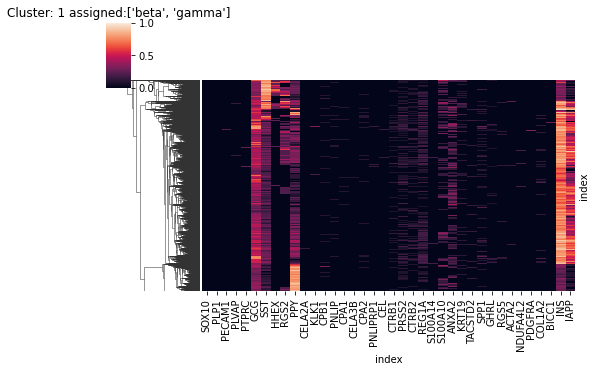

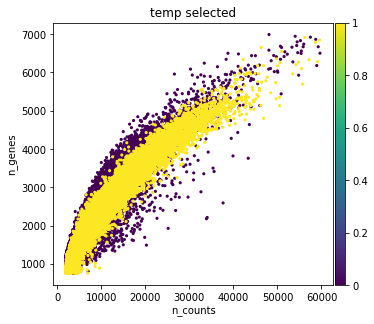


Cluster: 2 	size: 7392
Present: ['ductal']
ductal                                          0.869318
NA                                              0.090639
ductal_endothelial                              0.008658
beta                                            0.005682
alpha_ductal                                    0.005276
beta_ductal                                     0.004735
acinar_ductal                                   0.002841
ductal_immune                                   0.002706
alpha                                           0.001894
endothelial                                     0.001082
ductal_gamma                                    0.001082
delta_ductal                                    0.000812
ductal_stellate_quiescent                       0.000812
immune                                          0.000676
beta_delta                                      0.000541
beta_immune                                     0.000406
gamma                                       

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


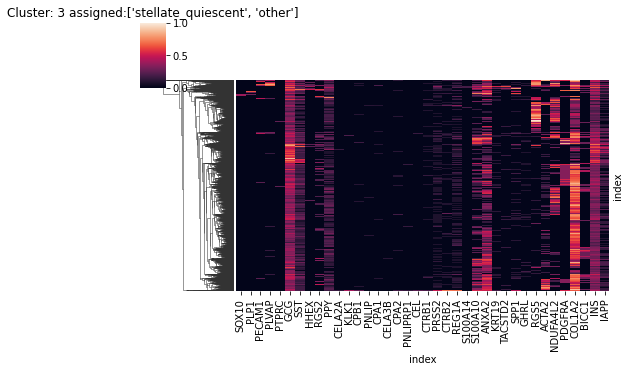

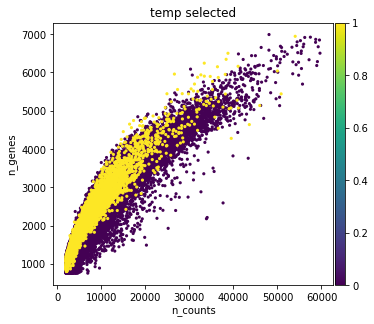


Cluster: 4 	size: 3626
Present: ['acinar']
acinar                           0.728902
acinar_ductal                    0.094319
NA                               0.065361
acinar_beta                      0.032819
acinar_alpha                     0.030061
ductal                           0.010756
acinar_endothelial               0.009653
acinar_gamma                     0.004688
alpha                            0.003585
beta                             0.002758
acinar_delta                     0.002482
acinar_beta_endothelial          0.001655
acinar_ductal_endothelial        0.001379
acinar_immune                    0.001379
acinar_beta_ductal               0.001379
acinar_alpha_ductal              0.001103
acinar_alpha_beta                0.001103
endothelial                      0.000552
beta_delta                       0.000552
gamma                            0.000552
acinar_ductal_gamma              0.000552
acinar_beta_delta                0.000552
acinar_schwann                  

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


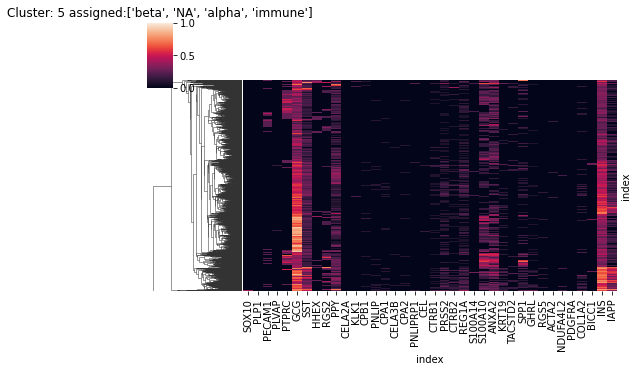

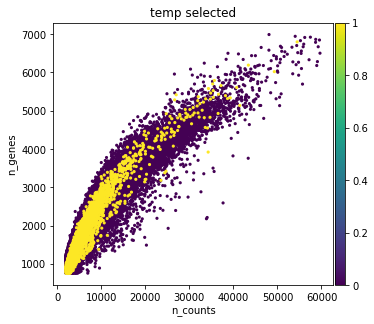


Cluster: 6 	size: 2754
Present: ['immune', 'NA']
immune                       0.606754
NA                           0.255991
endothelial_immune           0.078068
endothelial                  0.026507
beta_immune                  0.007988
alpha_immune                 0.007625
beta                         0.006899
beta_endothelial_immune      0.001816
ductal_immune                0.001452
gamma_immune                 0.001089
alpha                        0.001089
endothelial_gamma_immune     0.000726
immune_stellate_activated    0.000726
beta_endothelial             0.000726
ductal                       0.000726
acinar_immune                0.000726
immune_schwann               0.000363
acinar                       0.000363
alpha_endothelial_immune     0.000363
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


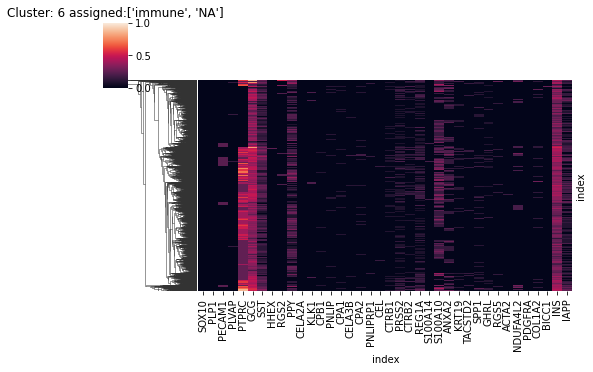

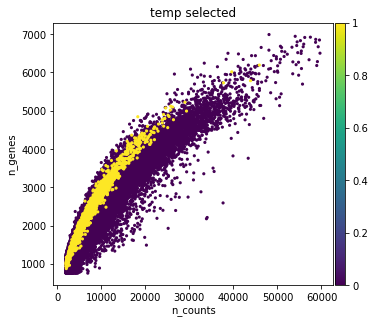


Cluster: 7 	size: 683
Present: ['endothelial']
endothelial                              0.821376
ductal_endothelial                       0.054173
alpha_endothelial                        0.052709
beta_endothelial                         0.033675
endothelial_gamma                        0.014641
delta_endothelial                        0.005857
endothelial_immune                       0.004392
acinar_endothelial                       0.002928
beta_delta_endothelial                   0.001464
acinar_ductal_endothelial                0.001464
beta_endothelial_gamma                   0.001464
ductal_endothelial_stellate_quiescent    0.001464
NA                                       0.001464
ductal                                   0.001464
ductal_endothelial_gamma                 0.001464
Name: type_union, dtype: float64


In [51]:
# Display cell type annotation distribution of each cluster.
cluster_annotate(assignment_df=assignment_df, cluster_col=clusters_col, present_threshold=0.1, nomain_threshold=0.7, save=True, cluster_annotation=cluster_annotation, adata_main=adata_rawnormalised)

In [52]:
# Correct annotation
cluster_annotation['6'] = ['immune']

checking  0
checking  1
**** Original cluster 1


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.3' as categorical


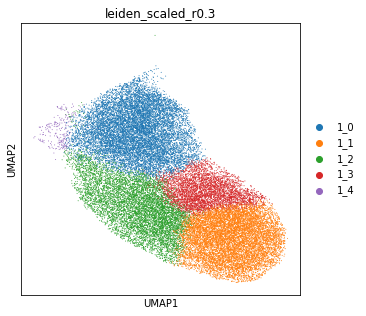


Cluster: 1_0 	size: 10990
Present: ['gamma', 'beta', 'delta']
gamma                            0.364968
beta                             0.278617
delta                            0.241856
beta_delta                       0.039126
NA                               0.015287
beta_gamma                       0.014650
beta_endothelial                 0.010100
delta_gamma                      0.005551
alpha_delta                      0.004368
beta_immune                      0.003094
endothelial_gamma                0.003094
delta_endothelial                0.002639
alpha                            0.002366
alpha_beta                       0.002275
acinar_beta                      0.001911
beta_delta_gamma                 0.001547
beta_epsilon                     0.001183
epsilon                          0.001092
beta_delta_endothelial           0.000819
alpha_gamma                      0.000728
delta_immune                     0.000637
beta_delta_immune                0.000455
beta_endothel

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


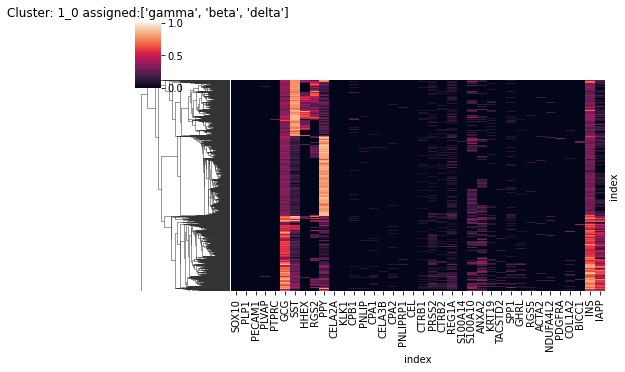

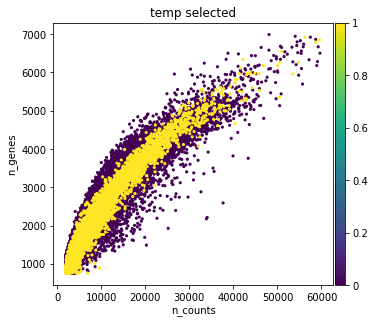


Cluster: 1_1 	size: 9828
Present: ['beta']
beta                      0.939967
beta_delta                0.028795
beta_endothelial          0.019027
beta_gamma                0.004986
beta_immune               0.002747
NA                        0.001832
beta_delta_endothelial    0.001119
beta_schwann              0.000509
acinar_beta               0.000407
beta_endothelial_gamma    0.000305
beta_delta_gamma          0.000102
delta                     0.000102
beta_delta_immune         0.000102
Name: type_union, dtype: float64

Cluster: 1_2 	size: 7450
Present: ['beta']
beta                       0.865503
beta_delta                 0.044430
delta                      0.027919
beta_endothelial           0.024161
NA                         0.016510
beta_immune                0.007114
beta_gamma                 0.005503
gamma                      0.002550
acinar_beta                0.001477
beta_delta_endothelial     0.001342
delta_endothelial          0.000537
beta_delta_gamma           0

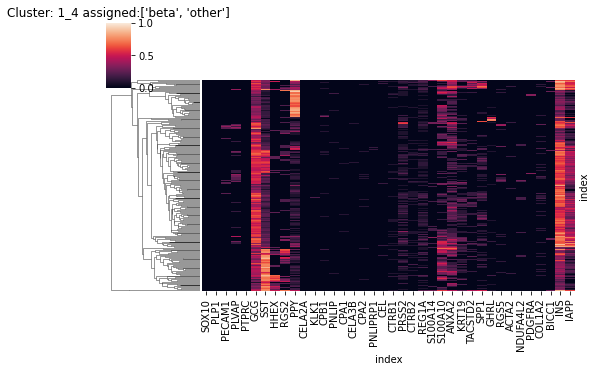

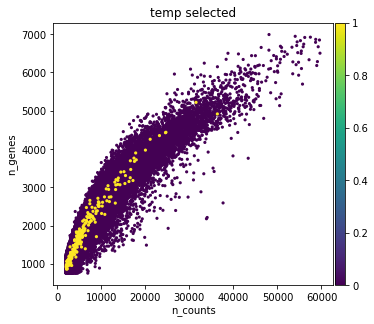

checking  2
checking  3
**** Original cluster 3


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.3' as categorical


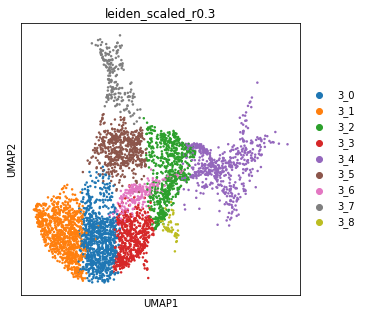


Cluster: 3_0 	size: 932
Present: ['stellate_quiescent']
stellate_quiescent                                   0.848712
stellate_activated_stellate_quiescent                0.068670
NA                                                   0.030043
stellate_activated                                   0.017167
endothelial_stellate_quiescent                       0.013948
beta_stellate_quiescent                              0.005365
gamma_stellate_quiescent                             0.002146
alpha_stellate_activated_stellate_quiescent          0.002146
acinar_stellate_quiescent                            0.002146
alpha_stellate_quiescent                             0.002146
schwann_stellate_quiescent                           0.001073
immune_stellate_quiescent                            0.001073
beta_stellate_activated_stellate_quiescent           0.001073
ductal_stellate_quiescent                            0.001073
endothelial_immune_stellate_quiescent                0.001073
acinar_stella

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


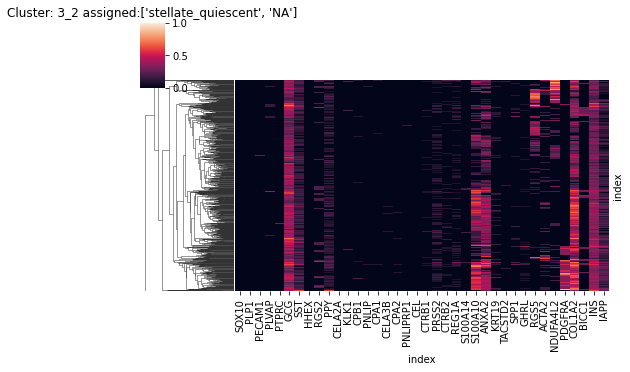

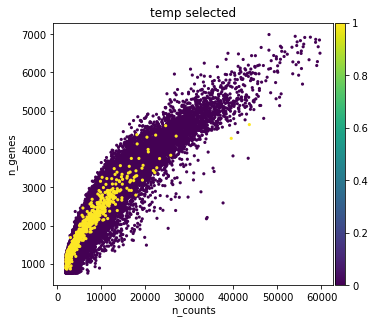


Cluster: 3_3 	size: 605
Present: ['stellate_quiescent']
stellate_quiescent                             0.821488
NA                                             0.051240
acinar_stellate_quiescent                      0.033058
endothelial_stellate_quiescent                 0.018182
stellate_activated_stellate_quiescent          0.014876
beta_stellate_quiescent                        0.011570
alpha_stellate_quiescent                       0.011570
stellate_activated                             0.008264
alpha_stellate_activated_stellate_quiescent    0.004959
acinar_stellate_activated                      0.003306
immune_stellate_quiescent                      0.003306
acinar                                         0.001653
beta_endothelial_stellate_quiescent            0.001653
alpha_stellate_activated                       0.001653
endothelial                                    0.001653
beta                                           0.001653
alpha                                          

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


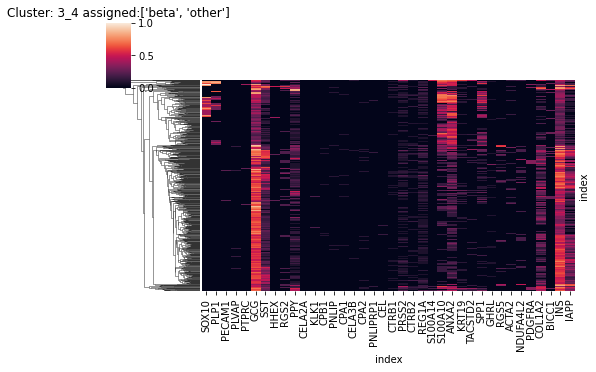

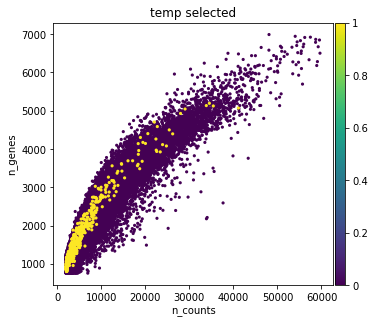


Cluster: 3_5 	size: 550
Present: ['stellate_activated', 'other']
stellate_activated                                          0.709091
stellate_activated_stellate_quiescent                       0.105455
NA                                                          0.080000
stellate_quiescent                                          0.027273
endothelial_stellate_quiescent                              0.025455
endothelial_stellate_activated_stellate_quiescent           0.021818
endothelial_stellate_activated                              0.009091
beta_endothelial_stellate_activated_stellate_quiescent      0.003636
beta_stellate_activated                                     0.003636
alpha_endothelial_stellate_quiescent                        0.003636
immune_stellate_quiescent                                   0.001818
immune_stellate_activated                                   0.001818
endothelial_immune_stellate_quiescent                       0.001818
ductal_endothelial_stellate_activated

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


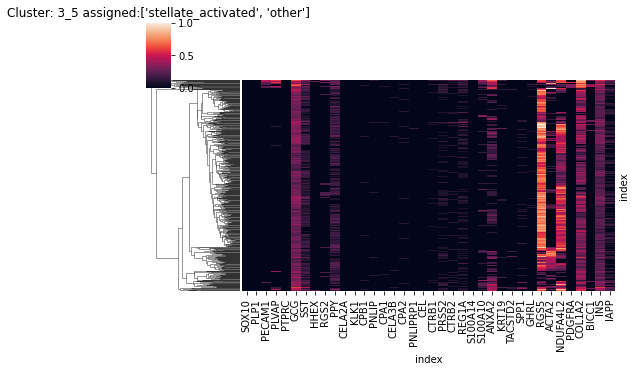

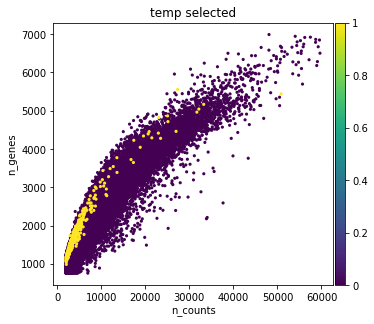


Cluster: 3_6 	size: 241
Present: ['stellate_quiescent', 'other']
stellate_quiescent                                          0.688797
stellate_activated_stellate_quiescent                       0.107884
NA                                                          0.095436
endothelial_stellate_quiescent                              0.016598
immune_stellate_quiescent                                   0.016598
beta                                                        0.012448
immune_stellate_activated                                   0.008299
stellate_activated                                          0.008299
immune                                                      0.008299
delta_stellate_quiescent                                    0.004149
endothelial_stellate_activated_stellate_quiescent           0.004149
ductal_stellate_quiescent                                   0.004149
endothelial_immune_stellate_activated_stellate_quiescent    0.004149
endothelial_immune_stellate_quiescent

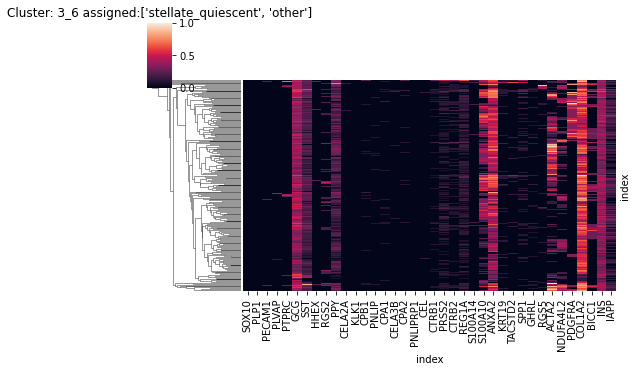

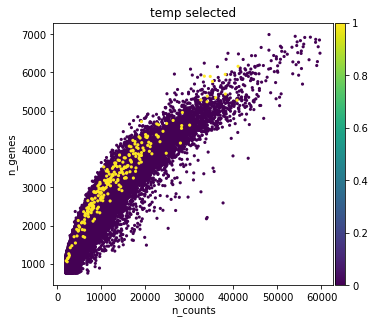


Cluster: 3_7 	size: 194
Present: ['endothelial_stellate_activated_stellate_quiescent', 'endothelial_stellate_activated']
endothelial_stellate_activated_stellate_quiescent            0.350515
endothelial_stellate_activated                               0.252577
endothelial_stellate_quiescent                               0.128866
endothelial                                                  0.123711
ductal_endothelial_stellate_activated_stellate_quiescent     0.030928
beta_endothelial_stellate_activated_stellate_quiescent       0.015464
alpha_endothelial_stellate_quiescent                         0.010309
ductal_endothelial_stellate_quiescent                        0.010309
alpha_endothelial_stellate_activated                         0.010309
endothelial_schwann_stellate_activated_stellate_quiescent    0.005155
ductal_endothelial_stellate_activated                        0.005155
stellate_quiescent                                           0.005155
endothelial_immune_stellate_activated_

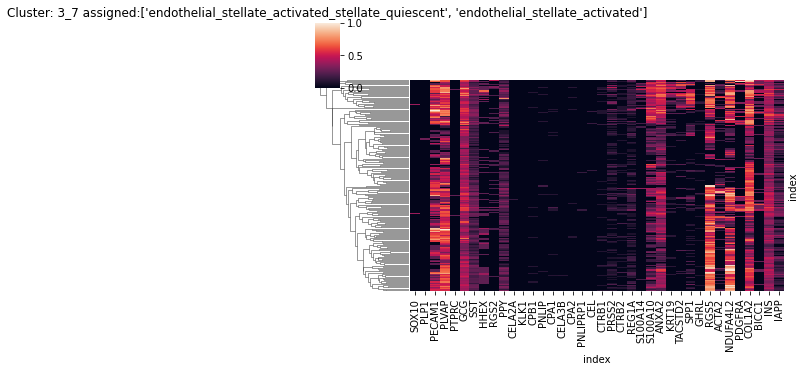

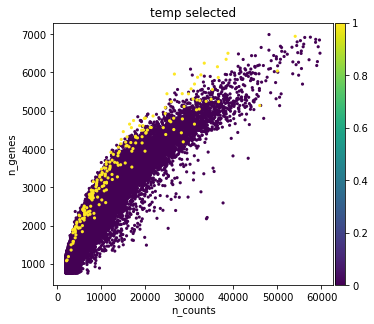


Cluster: 3_8 	size: 51
Present: ['ductal_stellate_quiescent', 'other']
ductal_stellate_quiescent                       0.450980
stellate_quiescent                              0.196078
ductal_stellate_activated_stellate_quiescent    0.098039
ductal_endothelial_stellate_quiescent           0.078431
ductal_stellate_activated                       0.058824
alpha_ductal_stellate_quiescent                 0.039216
stellate_activated                              0.019608
endothelial_stellate_quiescent                  0.019608
ductal_immune_stellate_quiescent                0.019608
stellate_activated_stellate_quiescent           0.019608
Name: type_union, dtype: float64


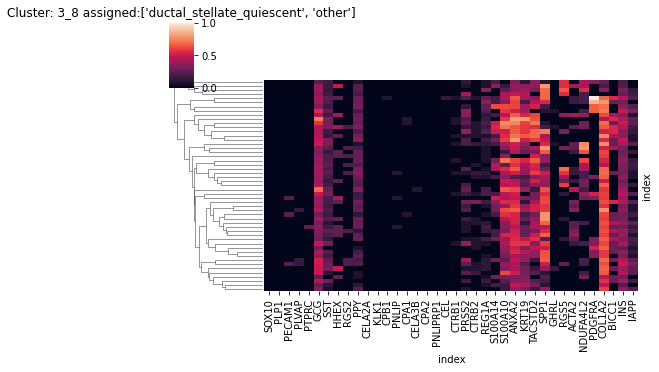

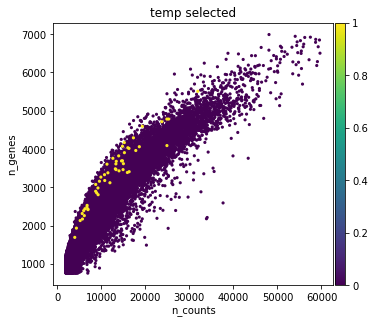

checking  4
checking  5
**** Original cluster 5


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r0.3' as categorical


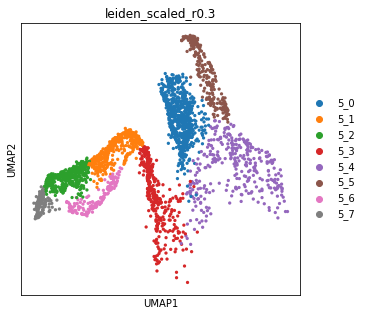


Cluster: 5_0 	size: 694
Present: ['beta', 'NA']
beta                       0.628242
NA                         0.219020
beta_immune                0.056196
beta_endothelial           0.028818
immune                     0.012968
alpha                      0.007205
endothelial                0.005764
acinar_beta                0.005764
beta_endothelial_immune    0.004323
gamma                      0.004323
alpha_beta                 0.004323
beta_gamma                 0.004323
delta                      0.004323
acinar_beta_immune         0.002882
gamma_immune               0.002882
beta_schwann               0.001441
ductal_immune              0.001441
acinar_beta_delta          0.001441
alpha_delta                0.001441
beta_delta_immune          0.001441
delta_immune               0.001441
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


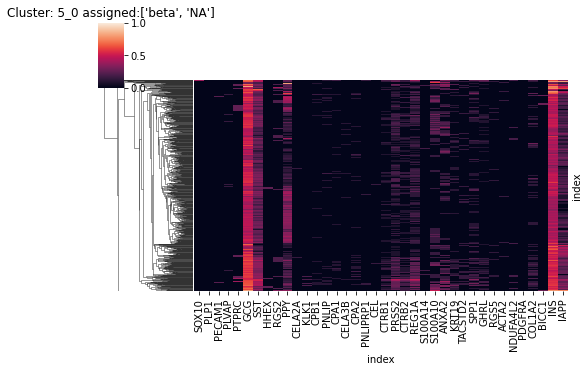

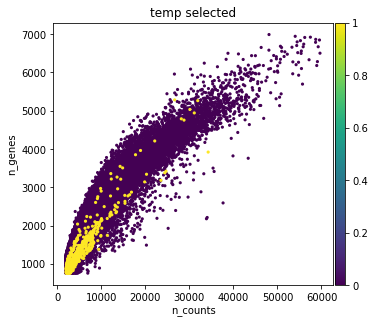


Cluster: 5_1 	size: 465
Present: ['NA', 'immune']
NA                               0.412903
immune                           0.217204
endothelial                      0.101075
endothelial_immune               0.064516
beta                             0.047312
beta_immune                      0.025806
alpha                            0.021505
beta_endothelial                 0.017204
alpha_immune                     0.017204
beta_endothelial_immune          0.010753
delta                            0.008602
alpha_endothelial_immune         0.008602
alpha_endothelial                0.006452
beta_delta_immune                0.006452
ductal_endothelial               0.006452
ductal_immune                    0.004301
delta_immune                     0.004301
ductal                           0.004301
gamma_immune                     0.002151
alpha_gamma_immune               0.002151
delta_endothelial                0.002151
stellate_quiescent               0.002151
gamma                    

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


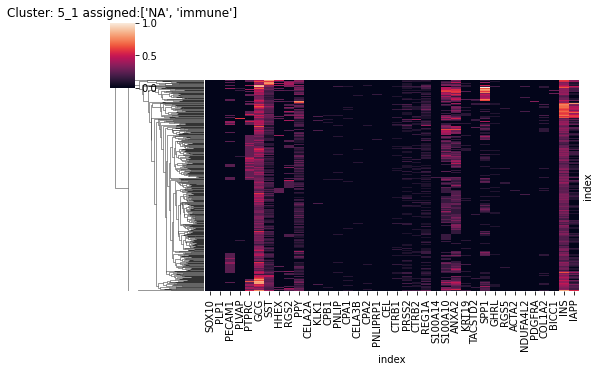

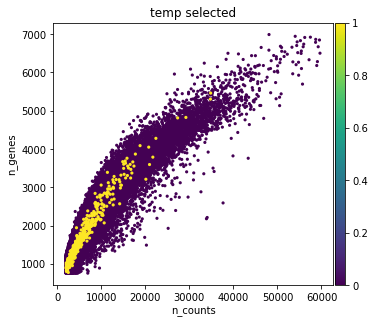


Cluster: 5_2 	size: 410
Present: ['immune', 'NA']
immune                       0.378049
NA                           0.304878
endothelial_immune           0.141463
endothelial                  0.114634
alpha_endothelial_immune     0.009756
gamma                        0.007317
alpha                        0.004878
gamma_immune                 0.004878
ductal_immune                0.004878
alpha_immune                 0.004878
delta_immune                 0.004878
beta_endothelial_immune      0.002439
alpha_endothelial            0.002439
delta_endothelial            0.002439
endothelial_gamma_immune     0.002439
delta                        0.002439
ductal_endothelial_immune    0.002439
ductal                       0.002439
beta                         0.002439
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


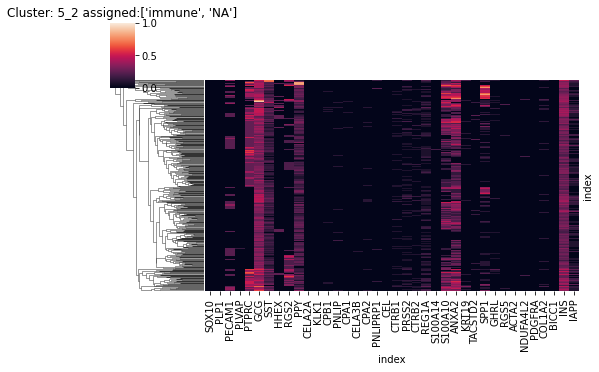

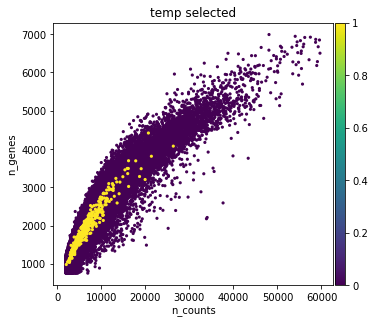


Cluster: 5_3 	size: 376
Present: ['beta', 'other']
beta                             0.534574
NA                               0.132979
alpha                            0.085106
beta_immune                      0.058511
immune                           0.026596
beta_endothelial                 0.026596
gamma                            0.023936
beta_delta                       0.018617
delta                            0.015957
alpha_beta                       0.010638
alpha_immune                     0.010638
beta_endothelial_immune          0.007979
beta_delta_immune                0.007979
alpha_delta                      0.005319
alpha_endothelial                0.005319
beta_delta_endothelial_immune    0.005319
beta_gamma_immune                0.005319
alpha_delta_immune               0.002660
delta_endothelial                0.002660
alpha_beta_gamma                 0.002660
endothelial_immune               0.002660
beta_delta_gamma                 0.002660
ductal                  

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


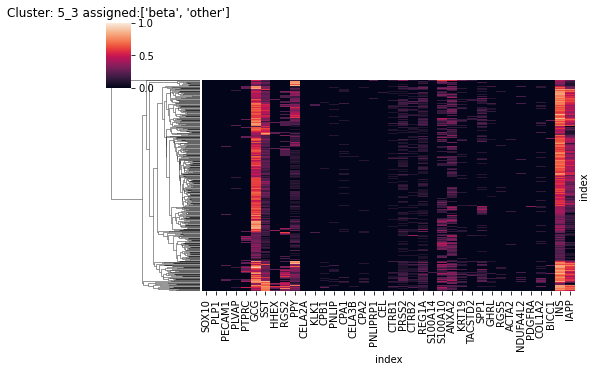

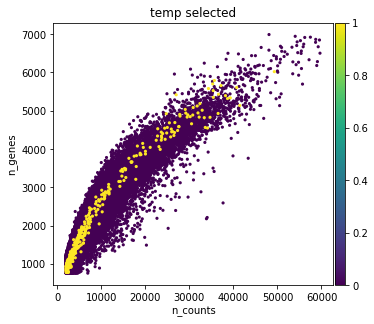


Cluster: 5_4 	size: 334
Present: ['alpha', 'other']
alpha                       0.646707
beta                        0.188623
alpha_immune                0.032934
NA                          0.026946
alpha_beta                  0.023952
alpha_endothelial           0.014970
beta_immune                 0.014970
beta_delta                  0.011976
alpha_delta                 0.008982
beta_endothelial            0.005988
alpha_beta_immune           0.002994
alpha_endothelial_immune    0.002994
beta_epsilon                0.002994
alpha_delta_immune          0.002994
beta_delta_immune           0.002994
gamma                       0.002994
immune                      0.002994
alpha_gamma                 0.002994
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


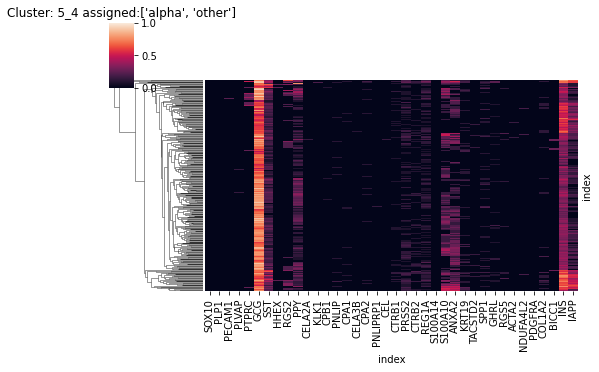

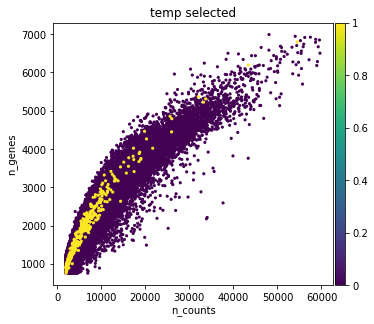


Cluster: 5_5 	size: 234
Present: ['alpha']
alpha                0.897436
beta                 0.029915
NA                   0.017094
alpha_delta          0.012821
alpha_endothelial    0.012821
alpha_beta           0.012821
immune               0.004274
beta_immune          0.004274
alpha_gamma          0.004274
alpha_immune         0.004274
Name: type_union, dtype: float64

Cluster: 5_6 	size: 150
Present: ['immune', 'NA']
immune                      0.526667
NA                          0.226667
endothelial_immune          0.106667
endothelial                 0.080000
alpha_immune                0.026667
gamma_immune                0.006667
beta_immune                 0.006667
alpha_endothelial           0.006667
beta_endothelial_immune     0.006667
endothelial_gamma_immune    0.006667
Name: type_union, dtype: float64


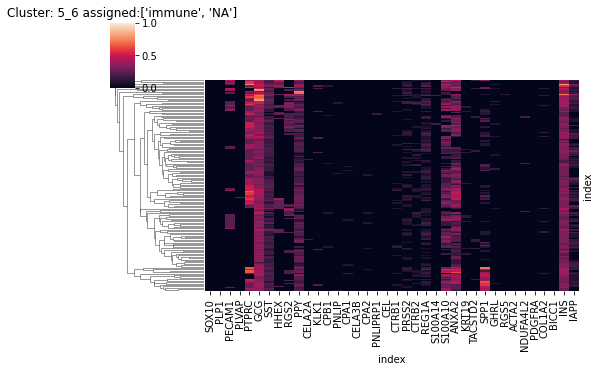

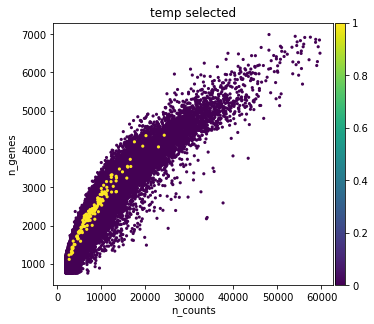


Cluster: 5_7 	size: 144
Present: ['immune', 'NA']
immune                0.520833
NA                    0.229167
endothelial_immune    0.194444
endothelial           0.048611
alpha                 0.006944
Name: type_union, dtype: float64


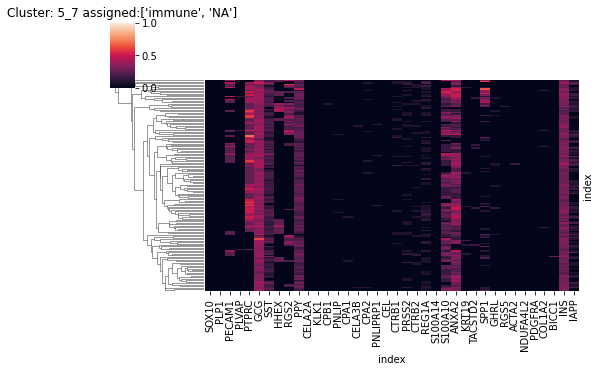

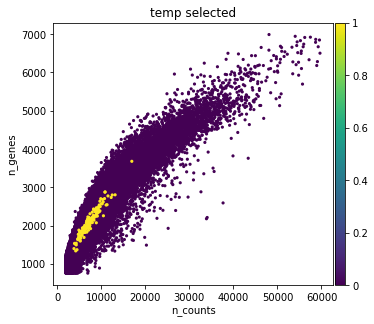

checking  6
checking  7


In [53]:
# recluster clusters that previously had less or more than 1 annotted cell type (exclusing  other).
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()), key=int):
    print("checking ", cluster)
    if len(cluster_annotation[cluster]) != 1 or len([cell_type for cell_type in cluster_annotation[cluster]]) == 0:
        print('**** Original cluster', cluster)
        res = 0.3
        adata_temp, assignment_df_temp = get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster, cluster_col='cluster', assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp, res=res, original_cluster=cluster, assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp, cluster_col='leiden_scaled_r' + str(res), present_threshold=0.2, nomain_threshold=0.8, save=True, cluster_annotation=cluster_annotation, adata_main=adata_rawnormalised)

In [54]:
# Correct entries in cluster_annotation dict - all clusters that do not have exactly one entry will be assigned 'NA'
# If cluster is to be removed add 'remove'

#cluster_annotation['1_4'] = ['NA'] # or beta?
cluster_annotation['3_2'] = ['stellate_quiescent']
#cluster_annotation['3_4'] = ['beta']
cluster_annotation['3_5'] = ['stellate_activated']
cluster_annotation['3_6'] = ['stellate_quiescent']
cluster_annotation['3_7'] = ['endothelial'] # probably only doublets
cluster_annotation['3_8'] = ['stellate_quiescent'] # probably only doublets
cluster_annotation['5_0'] = ['beta']
# bad annotations
cluster_annotation['5_1'] = ['immune']
cluster_annotation['5_2'] = ['immune']
cluster_annotation['5_3'] = ['beta']
# the
cluster_annotation['5_6'] = ['immune']
cluster_annotation['5_7'] = ['immune']

checking  0
checking  2
checking  4
checking  6
checking  7
checking  1_0
**** Original cluster 1_0


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r1' as categorical


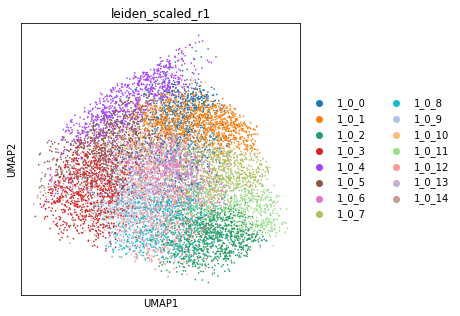


Cluster: 1_0_0 	size: 1094
Present: ['beta', 'other']
beta                      0.682815
gamma                     0.100548
delta                     0.066728
beta_delta                0.059415
beta_endothelial          0.031993
beta_immune               0.015539
NA                        0.011883
beta_gamma                0.010055
alpha_delta               0.005484
alpha_beta                0.003656
alpha                     0.002742
alpha_beta_delta          0.001828
delta_endothelial         0.001828
beta_delta_endothelial    0.001828
beta_delta_immune         0.001828
beta_epsilon              0.000914
beta_delta_gamma          0.000914
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


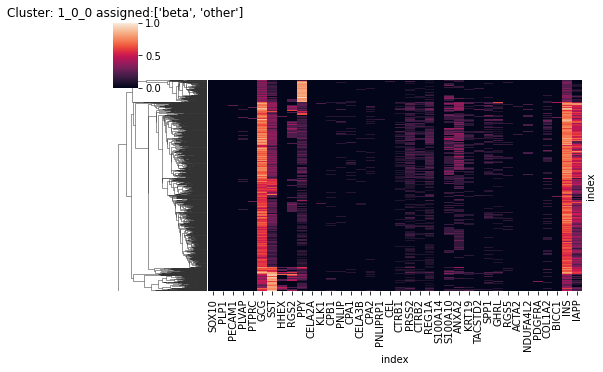

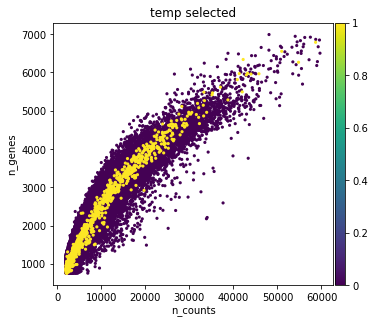


Cluster: 1_0_1 	size: 1061
Present: ['gamma', 'beta']
gamma                      0.590009
beta                       0.258247
delta                      0.032988
beta_delta                 0.032045
beta_gamma                 0.019793
alpha_delta                0.016965
NA                         0.013195
alpha_beta                 0.007540
endothelial_gamma          0.006598
beta_endothelial           0.004713
alpha                      0.003770
alpha_gamma                0.002828
beta_endothelial_gamma     0.001885
delta_gamma                0.001885
beta_immune                0.001885
alpha_delta_immune         0.000943
alpha_delta_endothelial    0.000943
beta_delta_immune          0.000943
alpha_beta_gamma           0.000943
alpha_delta_gamma          0.000943
endothelial                0.000943
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


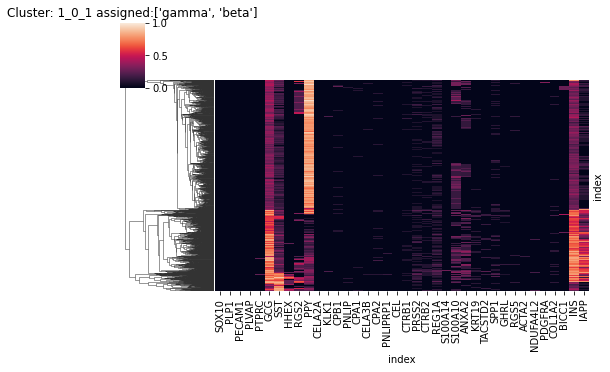

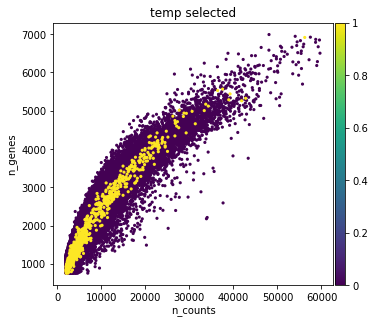


Cluster: 1_0_2 	size: 1018
Present: ['delta', 'beta']
delta                     0.398821
beta                      0.259332
gamma                     0.193517
beta_delta                0.086444
beta_gamma                0.035363
beta_delta_gamma          0.006876
delta_gamma               0.005894
NA                        0.004912
delta_endothelial         0.002947
beta_endothelial          0.001965
beta_delta_endothelial    0.000982
beta_immune               0.000982
gamma_immune              0.000982
beta_schwann              0.000982
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


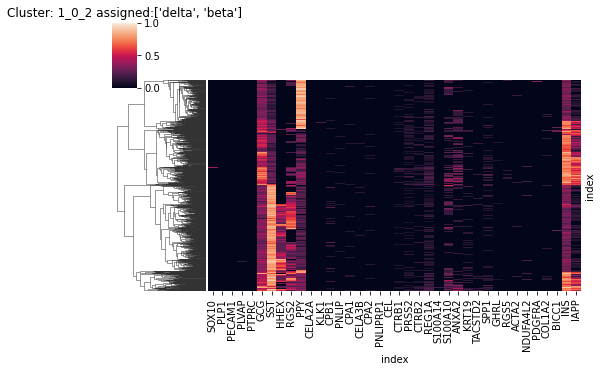

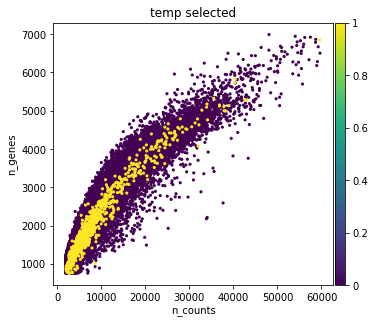


Cluster: 1_0_3 	size: 969
Present: ['delta', 'gamma', 'beta']
delta                      0.390093
gamma                      0.296182
beta                       0.229102
beta_delta                 0.027864
NA                         0.016512
delta_endothelial          0.007224
delta_gamma                0.006192
beta_gamma                 0.004128
beta_endothelial           0.004128
beta_immune                0.004128
beta_epsilon               0.003096
endothelial_gamma          0.003096
delta_immune               0.002064
beta_gamma_immune          0.001032
alpha_delta                0.001032
gamma_schwann              0.001032
beta_delta_endothelial     0.001032
beta_endothelial_immune    0.001032
alpha_beta                 0.001032
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


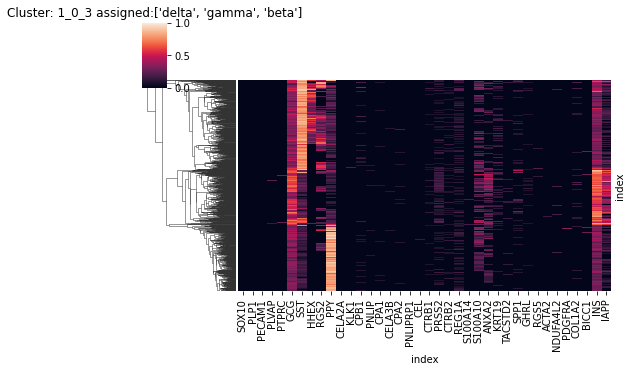

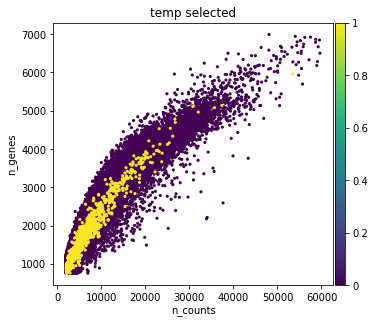


Cluster: 1_0_4 	size: 808
Present: ['gamma', 'beta']
gamma                            0.384901
beta                             0.319307
NA                               0.084158
delta                            0.065594
beta_delta                       0.030941
alpha                            0.023515
alpha_delta                      0.021040
beta_endothelial                 0.017327
epsilon                          0.014851
beta_gamma                       0.007426
endothelial_gamma                0.006188
alpha_beta                       0.003713
beta_epsilon                     0.003713
beta_immune                      0.002475
alpha_gamma                      0.002475
endothelial                      0.002475
alpha_delta_immune               0.001238
alpha_beta_delta                 0.001238
alpha_endothelial                0.001238
beta_delta_immune                0.001238
gamma_immune                     0.001238
alpha_delta_endothelial_gamma    0.001238
delta_epsilon         

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


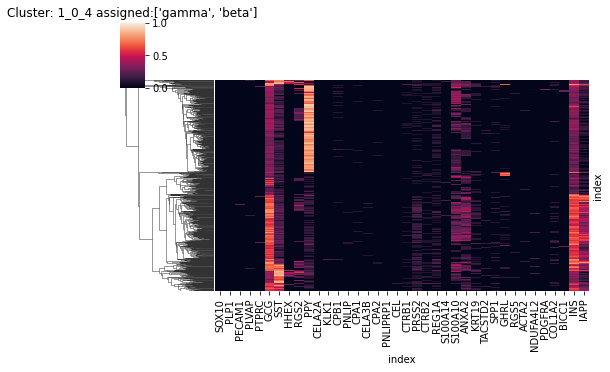

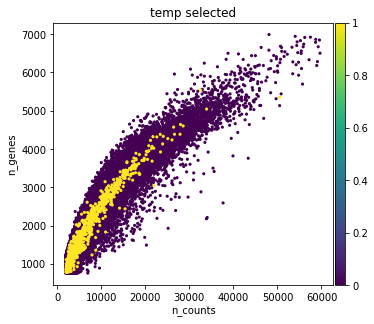


Cluster: 1_0_5 	size: 770
Present: ['gamma']
gamma                0.849351
delta                0.076623
beta                 0.032468
NA                   0.014286
delta_gamma          0.007792
beta_gamma           0.006494
endothelial_gamma    0.005195
beta_delta           0.002597
alpha_gamma          0.001299
alpha_delta          0.001299
beta_immune          0.001299
delta_endothelial    0.001299
Name: type_union, dtype: float64

Cluster: 1_0_6 	size: 745
Present: ['gamma', 'other']
gamma                      0.740940
delta                      0.140940
beta                       0.033557
delta_gamma                0.014765
beta_gamma                 0.014765
beta_delta                 0.014765
NA                         0.012081
endothelial_gamma          0.006711
beta_endothelial           0.004027
delta_endothelial          0.004027
beta_delta_endothelial     0.002685
beta_epsilon               0.002685
alpha_gamma                0.001342
beta_delta_gamma           0.001342
ga

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


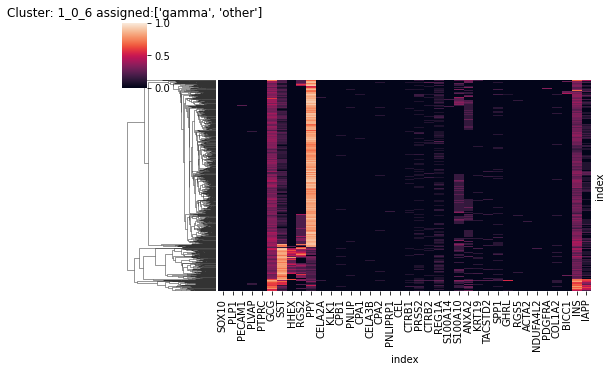

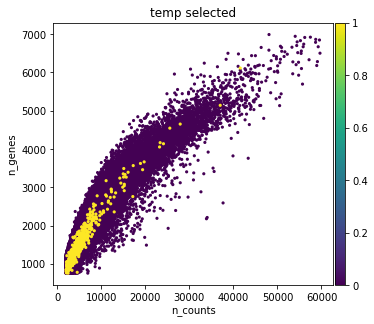


Cluster: 1_0_7 	size: 725
Present: ['gamma', 'beta', 'delta']
gamma                0.398621
beta                 0.295172
delta                0.209655
beta_delta           0.053793
beta_endothelial     0.009655
beta_gamma           0.009655
delta_gamma          0.006897
alpha_beta           0.006897
NA                   0.002759
beta_delta_gamma     0.002759
alpha_gamma          0.001379
alpha_delta          0.001379
endothelial_gamma    0.001379
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


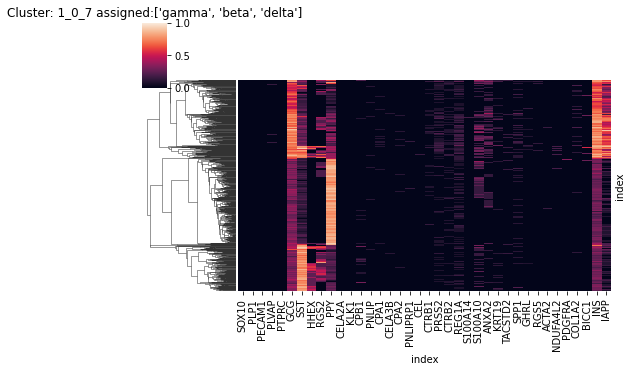

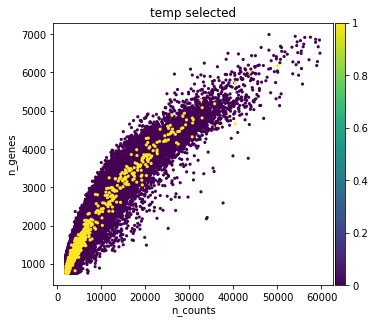


Cluster: 1_0_8 	size: 650
Present: ['beta', 'delta']
beta                      0.536923
delta                     0.289231
gamma                     0.058462
beta_delta                0.044615
beta_endothelial          0.032308
NA                        0.016923
beta_gamma                0.006154
beta_immune               0.004615
beta_delta_endothelial    0.003077
delta_endothelial         0.003077
alpha_delta               0.001538
beta_delta_immune         0.001538
delta_gamma               0.001538
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


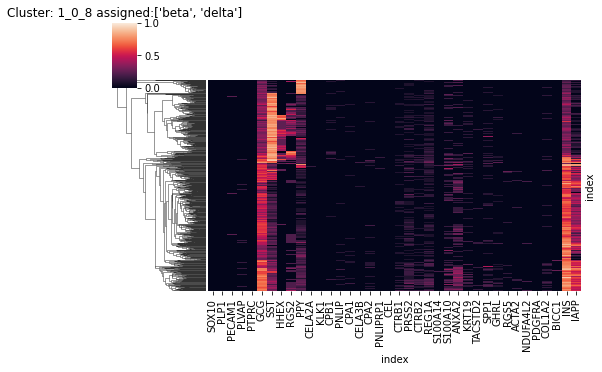

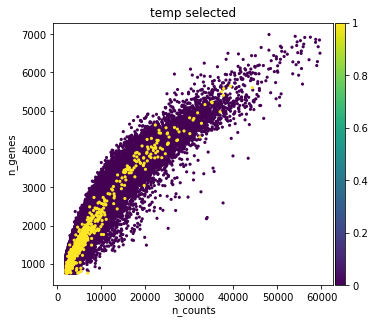


Cluster: 1_0_9 	size: 634
Present: ['gamma', 'delta']
gamma                           0.492114
delta                           0.378549
beta_gamma                      0.033123
beta                            0.029968
delta_gamma                     0.023659
beta_delta                      0.017350
beta_delta_gamma                0.004732
delta_endothelial               0.004732
NA                              0.004732
beta_endothelial                0.003155
endothelial_gamma               0.003155
delta_immune                    0.001577
beta_endothelial_gamma          0.001577
beta_delta_endothelial_gamma    0.001577
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


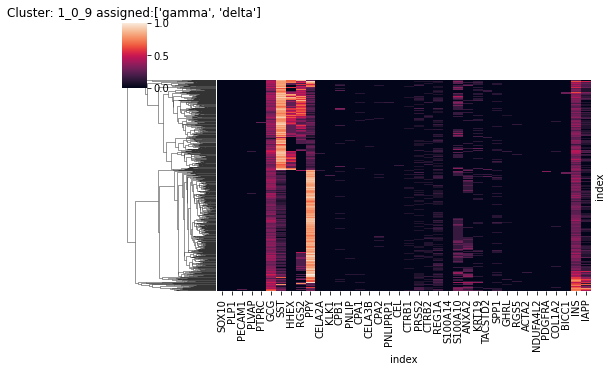

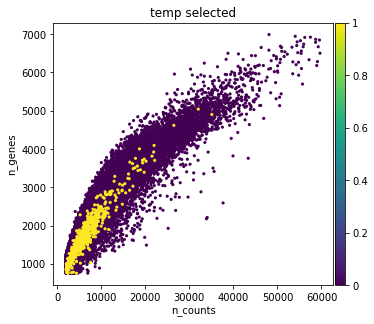


Cluster: 1_0_10 	size: 622
Present: ['gamma', 'delta', 'beta']
gamma                     0.416399
delta                     0.299035
beta                      0.212219
beta_delta                0.019293
beta_gamma                0.009646
NA                        0.008039
beta_endothelial          0.008039
endothelial_gamma         0.006431
alpha_delta               0.004823
beta_immune               0.003215
delta_endothelial         0.003215
alpha_beta                0.003215
beta_epsilon              0.001608
beta_delta_endothelial    0.001608
delta_immune              0.001608
gamma_schwann             0.001608
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


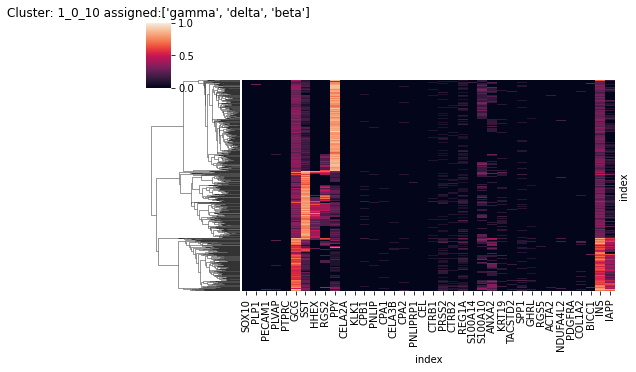

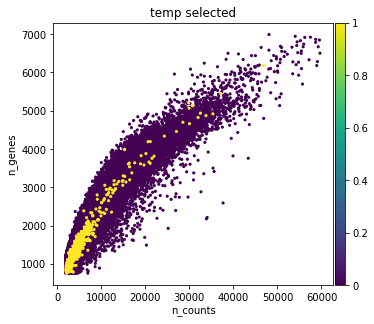


Cluster: 1_0_11 	size: 620
Present: ['beta', 'delta']
beta                      0.446774
delta                     0.316129
gamma                     0.112903
beta_delta                0.074194
beta_gamma                0.020968
beta_endothelial          0.014516
NA                        0.003226
beta_schwann              0.001613
delta_gamma               0.001613
beta_endothelial_gamma    0.001613
endothelial_gamma         0.001613
beta_immune               0.001613
delta_endothelial         0.001613
beta_delta_gamma          0.001613
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


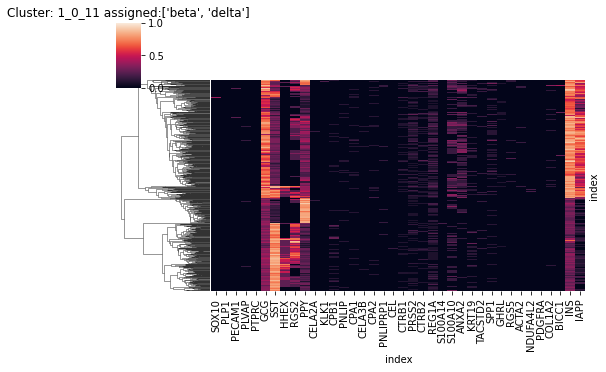

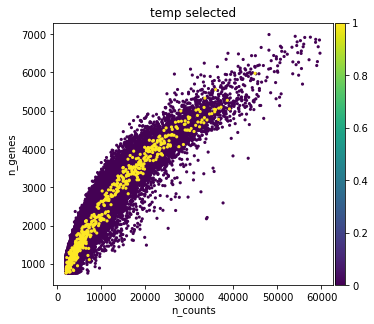


Cluster: 1_0_12 	size: 603
Present: ['delta', 'other']
delta                0.636816
gamma                0.160862
beta                 0.135987
beta_delta           0.031509
beta_gamma           0.013267
delta_endothelial    0.006633
delta_gamma          0.004975
NA                   0.003317
beta_epsilon         0.001658
beta_endothelial     0.001658
beta_immune          0.001658
endothelial_gamma    0.001658
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


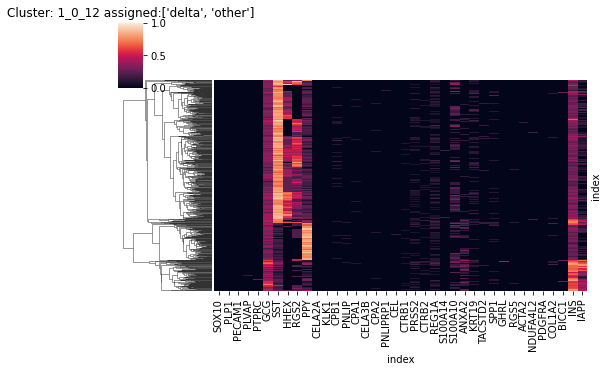

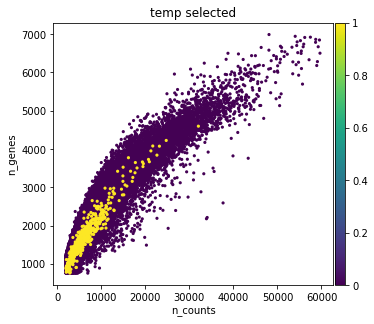


Cluster: 1_0_13 	size: 516
Present: ['gamma', 'delta']
gamma                 0.387597
delta                 0.370155
beta                  0.170543
beta_delta            0.029070
beta_gamma            0.013566
delta_gamma           0.009690
NA                    0.007752
beta_endothelial      0.003876
delta_gamma_immune    0.001938
delta_endothelial     0.001938
beta_epsilon          0.001938
alpha_beta_delta      0.001938
Name: type_union, dtype: float64


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


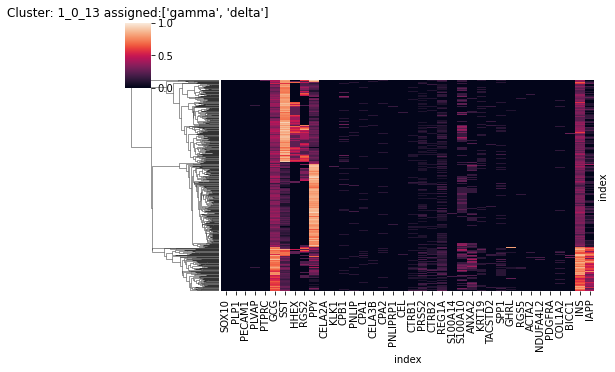

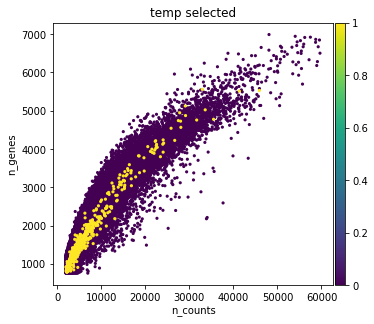


Cluster: 1_0_14 	size: 155
Present: ['beta', 'other']
beta                       0.554839
acinar_beta                0.135484
delta                      0.077419
gamma                      0.058065
beta_delta                 0.045161
acinar_beta_delta          0.019355
NA                         0.019355
acinar_beta_endothelial    0.012903
beta_delta_gamma           0.012903
acinar_gamma               0.006452
acinar_delta               0.006452
delta_immune               0.006452
acinar_beta_immune         0.006452
beta_endothelial           0.006452
beta_epsilon               0.006452
alpha_beta                 0.006452
beta_gamma                 0.006452
endothelial_gamma          0.006452
acinar                     0.006452
Name: type_union, dtype: float64


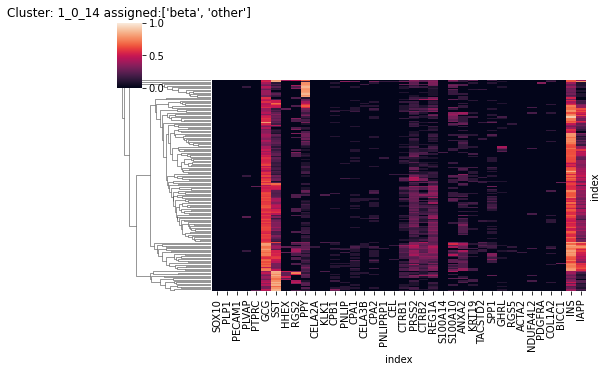

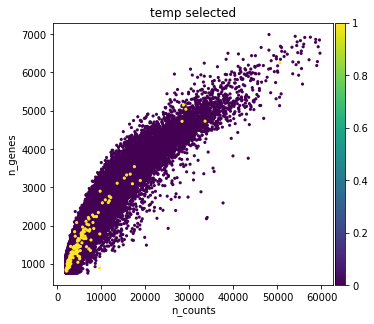

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r1' as categorical


checking  1_1
checking  1_2
checking  1_3
checking  1_4
**** Original cluster 1_4


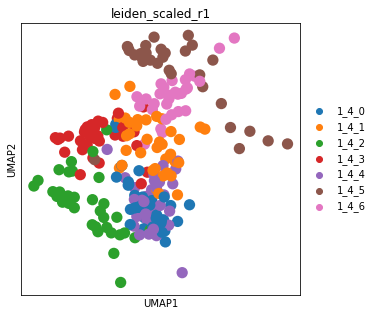


Cluster: 1_4_0 	size: 37
Present: ['beta', 'delta', 'gamma']
beta     0.351351
delta    0.270270
gamma    0.270270
NA       0.108108
Name: type_union, dtype: float64


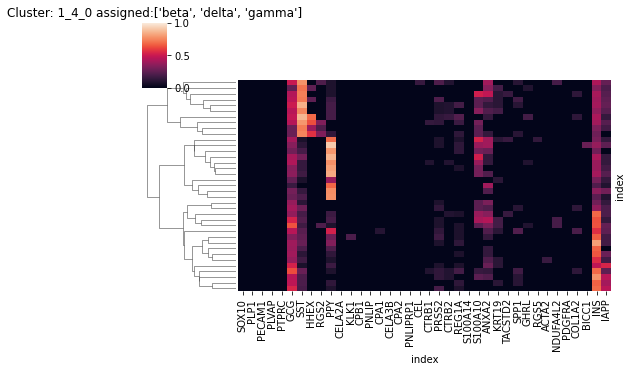

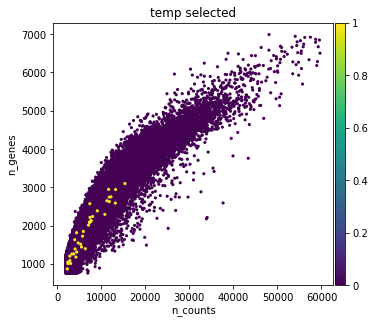


Cluster: 1_4_1 	size: 36
Present: ['beta', 'gamma', 'delta']
beta                0.388889
gamma               0.250000
delta               0.222222
beta_endothelial    0.055556
NA                  0.055556
beta_epsilon        0.027778
Name: type_union, dtype: float64


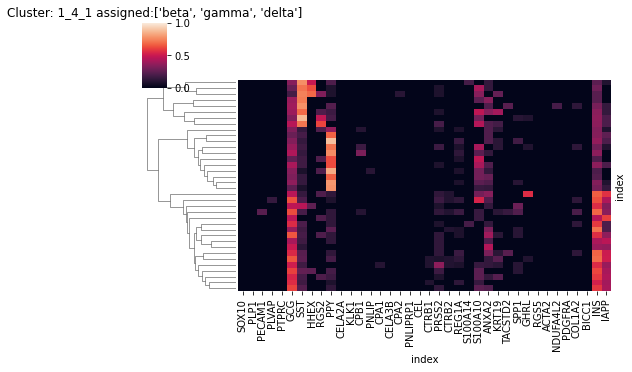

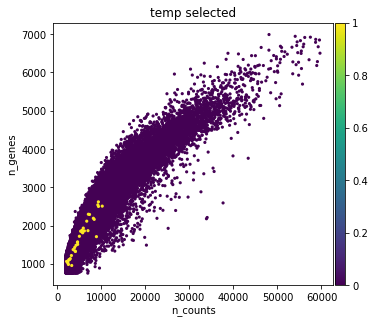


Cluster: 1_4_2 	size: 35
Present: ['beta', 'other']
beta                0.657143
beta_delta          0.114286
beta_ductal         0.057143
NA                  0.028571
delta_ductal        0.028571
gamma               0.028571
delta               0.028571
beta_gamma          0.028571
beta_endothelial    0.028571
Name: type_union, dtype: float64


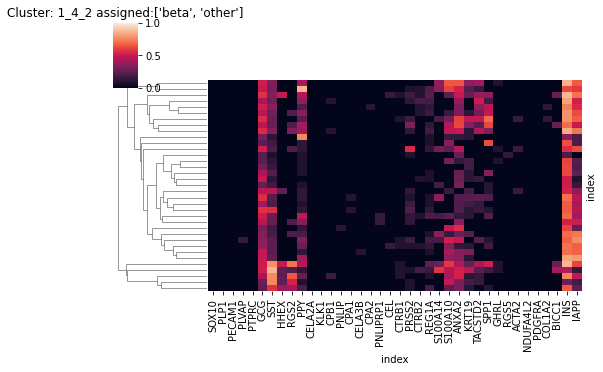

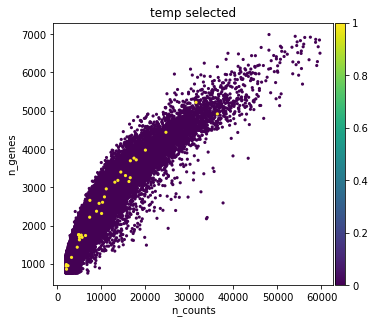


Cluster: 1_4_3 	size: 34
Present: ['beta', 'other']
beta                      0.676471
gamma                     0.176471
beta_delta                0.058824
beta_endothelial          0.058824
beta_delta_endothelial    0.029412
Name: type_union, dtype: float64


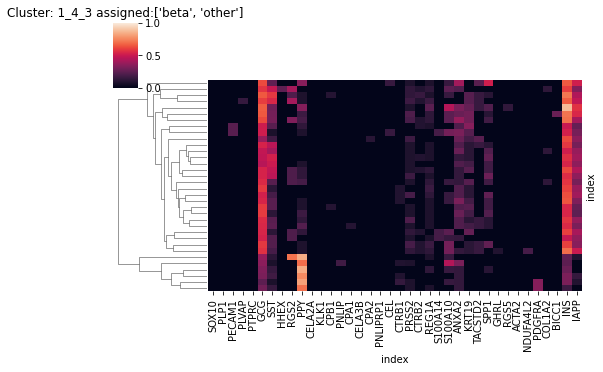

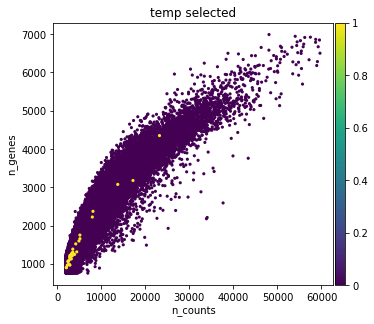


Cluster: 1_4_4 	size: 33
Present: ['delta', 'beta']
delta         0.454545
beta          0.303030
NA            0.151515
gamma         0.060606
beta_delta    0.030303
Name: type_union, dtype: float64


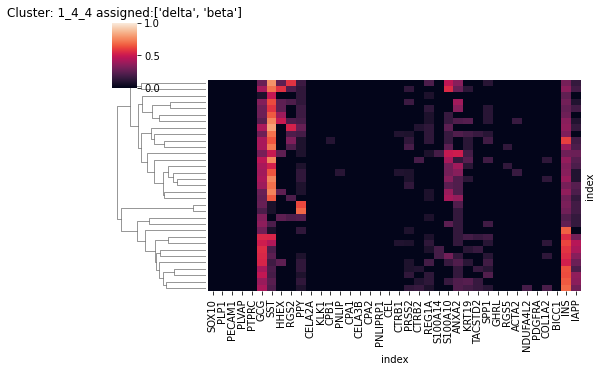

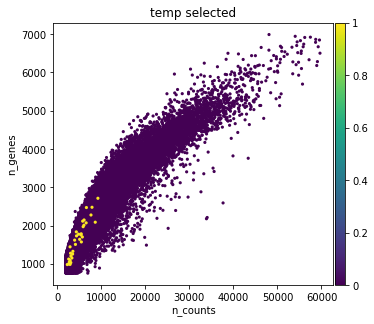


Cluster: 1_4_5 	size: 31
Present: ['beta_endothelial', 'other']
beta_endothelial                0.580645
beta_delta_endothelial          0.161290
beta                            0.064516
alpha_endothelial               0.064516
beta_delta                      0.032258
alpha_beta_delta_endothelial    0.032258
NA                              0.032258
endothelial                     0.032258
Name: type_union, dtype: float64


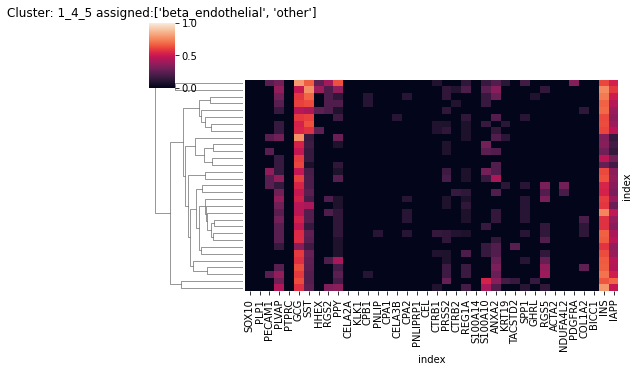

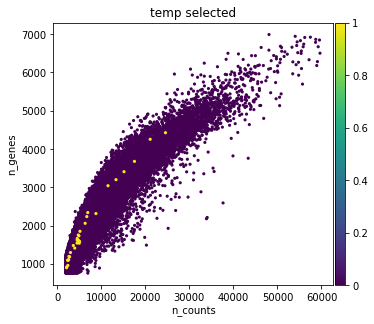


Cluster: 1_4_6 	size: 30
Present: ['beta', 'other']
beta                 0.433333
delta                0.100000
alpha                0.100000
epsilon              0.100000
beta_delta           0.066667
NA                   0.066667
gamma                0.033333
alpha_delta          0.033333
alpha_endothelial    0.033333
beta_endothelial     0.033333
Name: type_union, dtype: float64


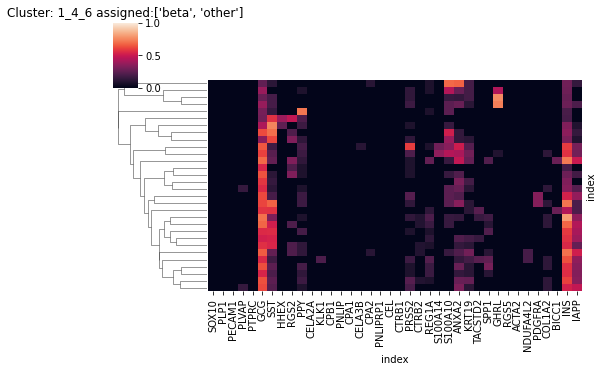

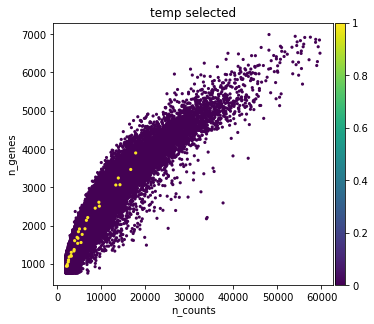

checking  3_0
checking  3_1
checking  3_2
checking  3_3
checking  3_4
**** Original cluster 3_4


/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r1' as categorical


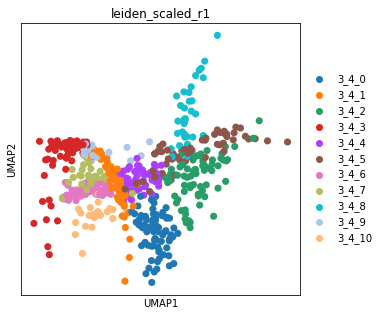


Cluster: 3_4_0 	size: 70
Present: ['beta', 'other']
beta                             0.714286
beta_schwann                     0.057143
beta_endothelial                 0.057143
NA                               0.057143
beta_delta                       0.042857
beta_stellate_activated          0.028571
beta_delta_stellate_quiescent    0.014286
gamma                            0.014286
beta_stellate_quiescent          0.014286
Name: type_union, dtype: float64


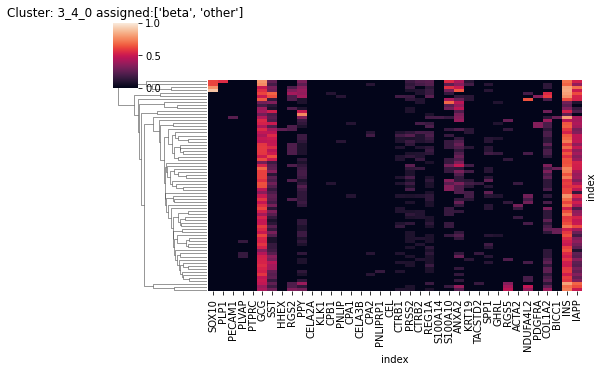

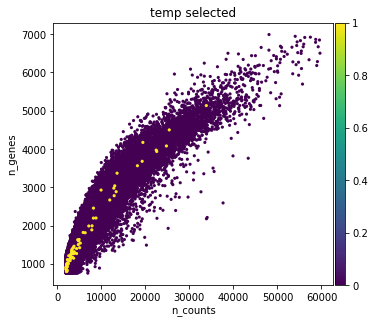


Cluster: 3_4_1 	size: 70
Present: ['NA', 'schwann']
NA                0.414286
schwann           0.400000
beta              0.142857
ductal_schwann    0.028571
beta_ductal       0.014286
Name: type_union, dtype: float64


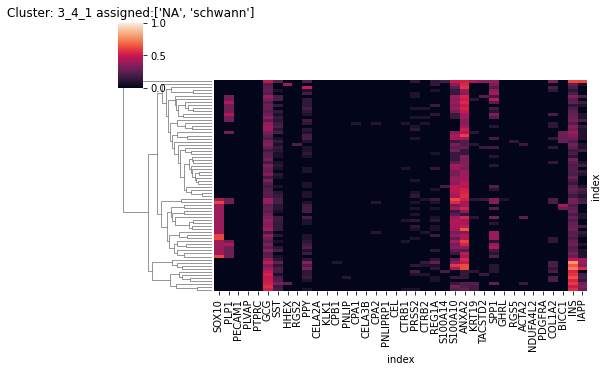

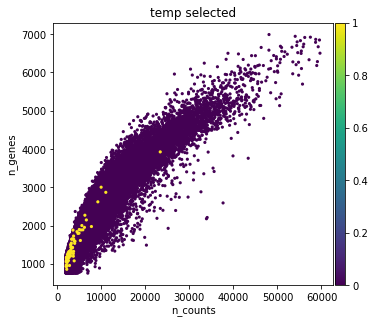


Cluster: 3_4_2 	size: 70
Present: ['beta']
beta           0.814286
NA             0.071429
beta_delta     0.042857
alpha_beta     0.028571
alpha          0.014286
alpha_delta    0.014286
gamma          0.014286
Name: type_union, dtype: float64

Cluster: 3_4_3 	size: 70
Present: ['schwann', 'NA']
schwann                                  0.528571
NA                                       0.214286
ductal_schwann                           0.071429
stellate_quiescent                       0.057143
ductal_stellate_quiescent                0.057143
ductal                                   0.028571
immune_schwann                           0.014286
endothelial                              0.014286
acinar_endothelial_stellate_quiescent    0.014286
Name: type_union, dtype: float64


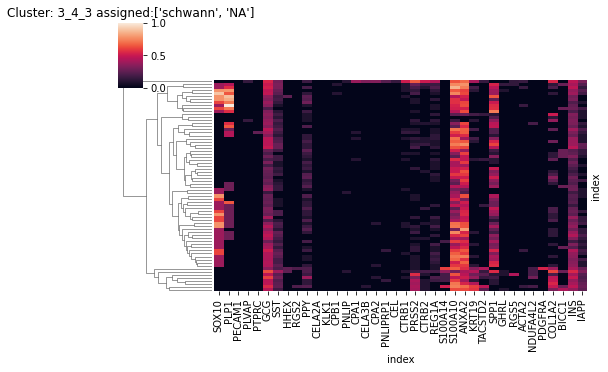

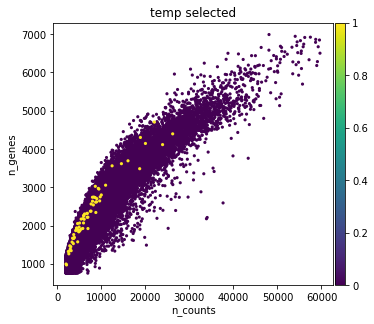


Cluster: 3_4_4 	size: 69
Present: ['beta', 'alpha']
beta                             0.420290
alpha                            0.260870
beta_stellate_quiescent          0.072464
beta_delta                       0.057971
alpha_beta                       0.028986
beta_endothelial                 0.028986
endothelial                      0.014493
alpha_beta_stellate_quiescent    0.014493
acinar_beta                      0.014493
beta_delta_stellate_quiescent    0.014493
NA                               0.014493
alpha_beta_endothelial           0.014493
alpha_stellate_activated         0.014493
beta_stellate_activated          0.014493
alpha_endothelial                0.014493
Name: type_union, dtype: float64


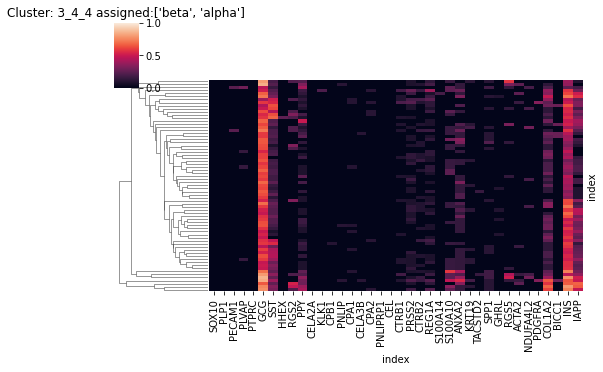

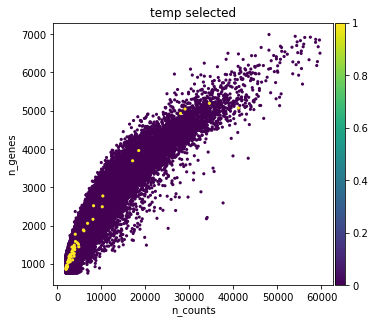


Cluster: 3_4_5 	size: 59
Present: ['alpha', 'beta']
alpha                             0.576271
beta                              0.203390
alpha_schwann                     0.050847
alpha_beta                        0.050847
NA                                0.033898
alpha_gamma_stellate_quiescent    0.016949
beta_immune                       0.016949
alpha_beta_endothelial            0.016949
alpha_immune_schwann              0.016949
alpha_beta_stellate_quiescent     0.016949
Name: type_union, dtype: float64


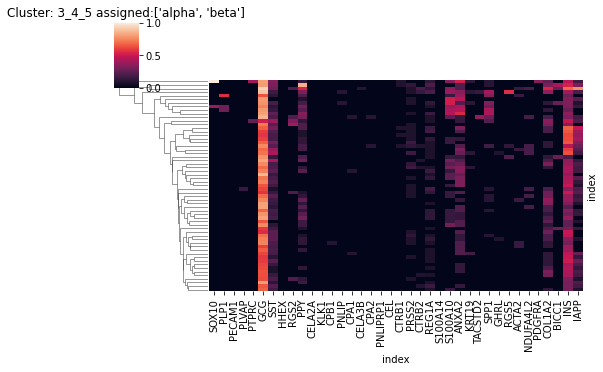

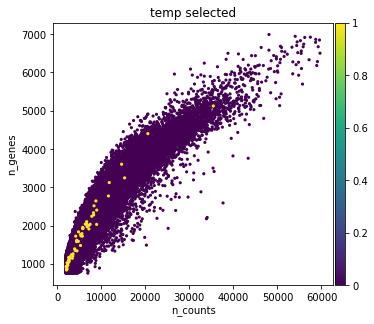


Cluster: 3_4_6 	size: 54
Present: ['beta', 'beta_stellate_quiescent', 'alpha']
beta                             0.388889
beta_stellate_quiescent          0.222222
alpha                            0.203704
NA                               0.055556
stellate_quiescent               0.037037
beta_delta_stellate_quiescent    0.018519
beta_immune                      0.018519
beta_delta_endothelial_gamma     0.018519
alpha_beta                       0.018519
beta_delta_gamma                 0.018519
Name: type_union, dtype: float64


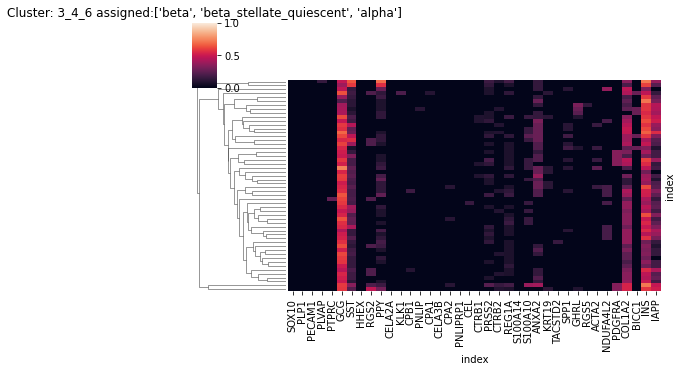

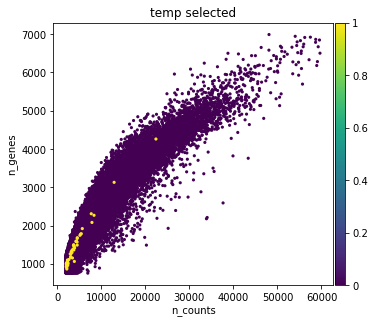


Cluster: 3_4_7 	size: 37
Present: ['NA', 'beta']
NA                                     0.324324
beta                                   0.270270
beta_endothelial                       0.162162
alpha_beta                             0.054054
beta_endothelial_stellate_activated    0.027027
schwann                                0.027027
delta                                  0.027027
alpha                                  0.027027
beta_stellate_activated                0.027027
beta_stellate_quiescent                0.027027
gamma                                  0.027027
Name: type_union, dtype: float64


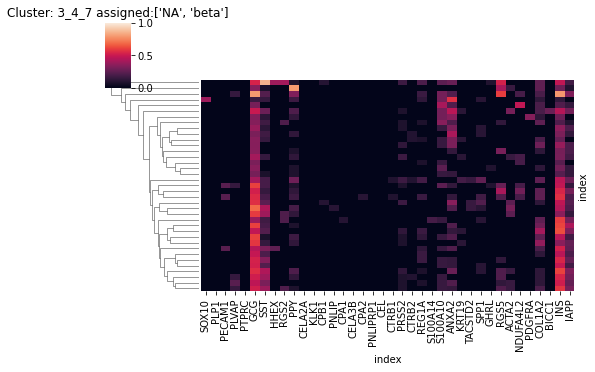

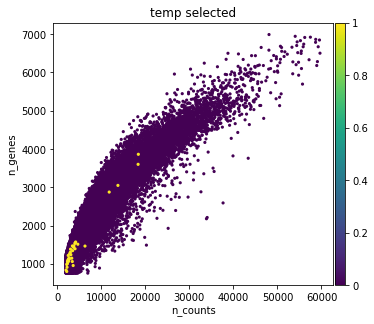


Cluster: 3_4_8 	size: 35
Present: ['beta', 'other']
beta                      0.714286
alpha                     0.085714
beta_delta                0.057143
alpha_beta_delta          0.057143
alpha_delta               0.028571
beta_endothelial          0.028571
alpha_beta_endothelial    0.028571
Name: type_union, dtype: float64


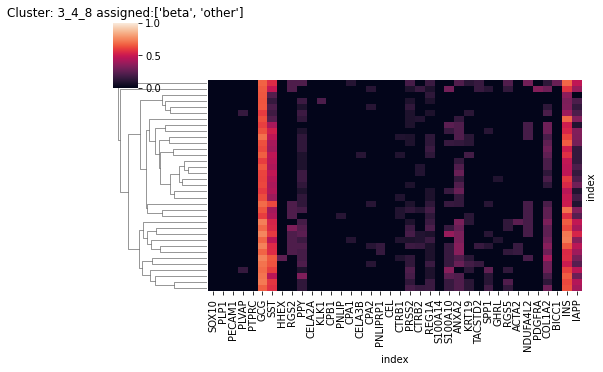

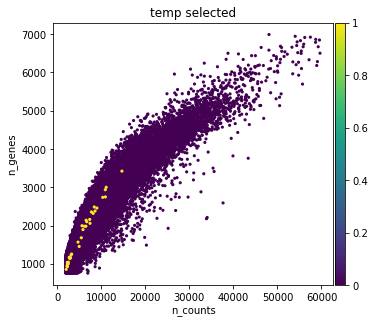


Cluster: 3_4_9 	size: 33
Present: ['schwann', 'NA']
schwann                    0.333333
NA                         0.303030
beta                       0.151515
beta_stellate_quiescent    0.121212
ductal_schwann             0.060606
beta_immune                0.030303
Name: type_union, dtype: float64


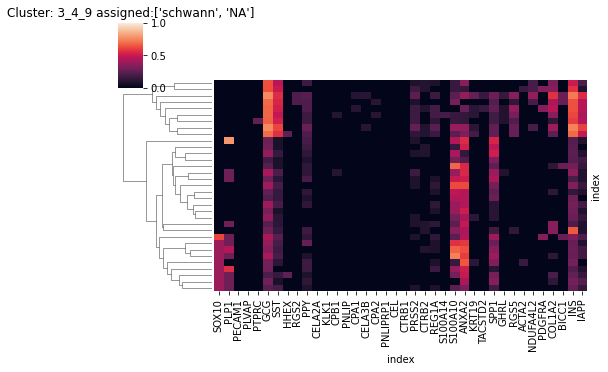

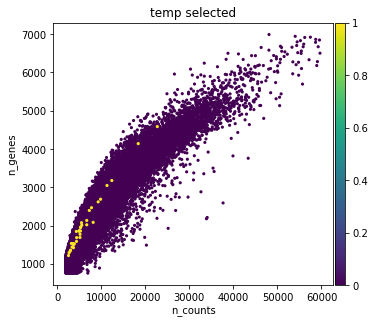


Cluster: 3_4_10 	size: 27
Present: ['beta', 'NA']
beta                       0.407407
NA                         0.296296
beta_stellate_quiescent    0.111111
alpha                      0.074074
alpha_beta                 0.074074
stellate_quiescent         0.037037
Name: type_union, dtype: float64


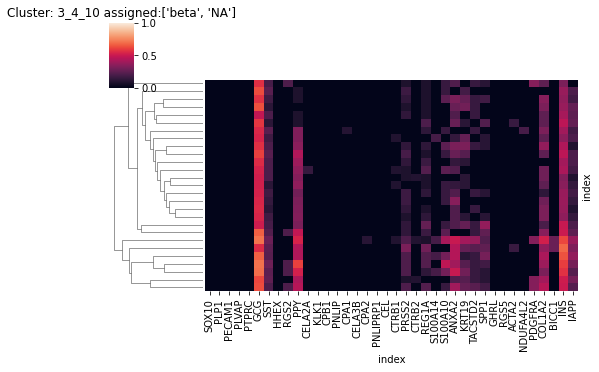

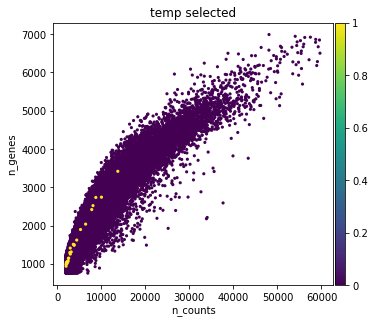

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'leiden_scaled_r1' as categorical


checking  3_5
checking  3_6
checking  3_7
checking  3_8
checking  5_0
checking  5_1
checking  5_2
checking  5_3
checking  5_4
**** Original cluster 5_4


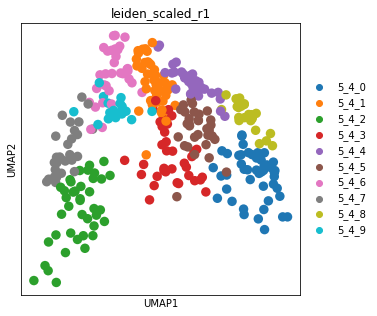


Cluster: 5_4_0 	size: 46
Present: ['alpha']
alpha                0.913043
beta                 0.043478
alpha_endothelial    0.021739
NA                   0.021739
Name: type_union, dtype: float64

Cluster: 5_4_1 	size: 43
Present: ['alpha']
alpha                0.813953
alpha_beta           0.046512
beta                 0.046512
alpha_endothelial    0.023256
alpha_delta          0.023256
alpha_gamma          0.023256
beta_delta           0.023256
Name: type_union, dtype: float64

Cluster: 5_4_2 	size: 40
Present: ['beta', 'other']
beta                  0.525
alpha_beta            0.100
alpha                 0.075
beta_endothelial      0.050
beta_immune           0.050
alpha_delta           0.050
beta_delta            0.050
beta_epsilon          0.025
alpha_delta_immune    0.025
beta_delta_immune     0.025
NA                    0.025
Name: type_union, dtype: float64


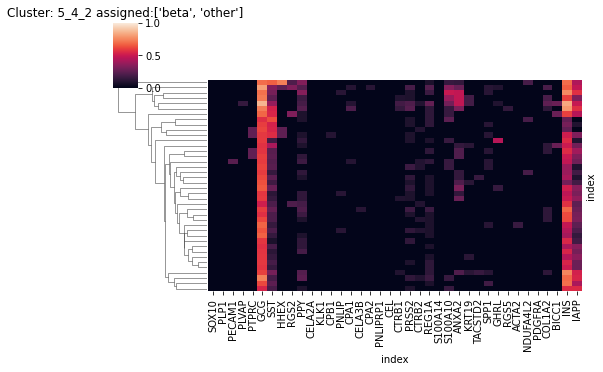

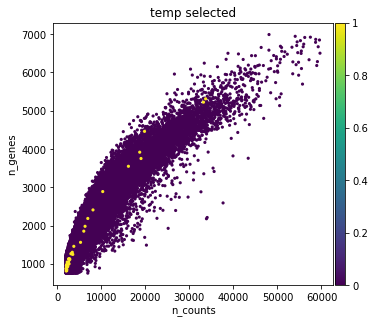


Cluster: 5_4_3 	size: 37
Present: ['alpha', 'other']
alpha                0.783784
beta                 0.081081
alpha_beta           0.027027
NA                   0.027027
immune               0.027027
alpha_immune         0.027027
alpha_endothelial    0.027027
Name: type_union, dtype: float64


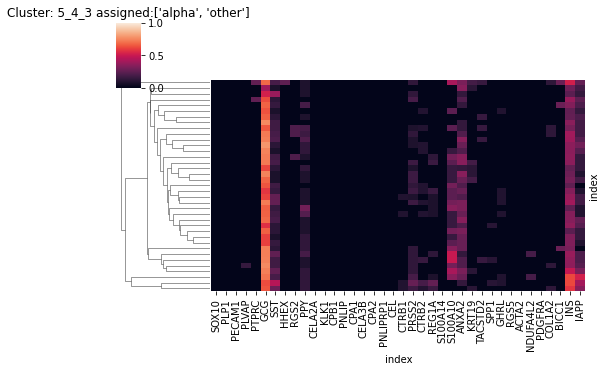

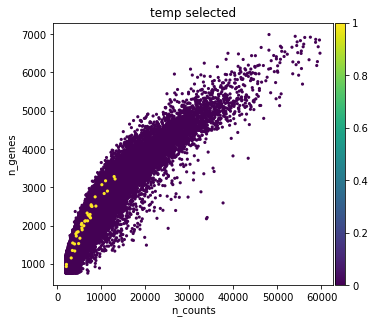


Cluster: 5_4_4 	size: 33
Present: ['alpha']
alpha           0.939394
alpha_immune    0.060606
Name: type_union, dtype: float64

Cluster: 5_4_5 	size: 32
Present: ['alpha']
alpha                0.87500
alpha_immune         0.03125
beta                 0.03125
alpha_beta           0.03125
alpha_endothelial    0.03125
Name: type_union, dtype: float64

Cluster: 5_4_6 	size: 32
Present: ['alpha', 'beta']
alpha                0.46875
beta                 0.28125
NA                   0.15625
beta_immune          0.06250
alpha_beta_immune    0.03125
Name: type_union, dtype: float64


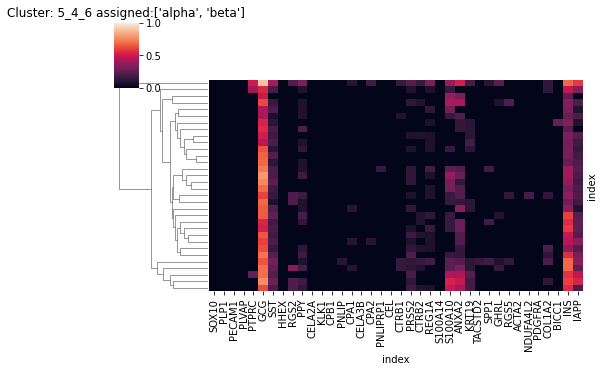

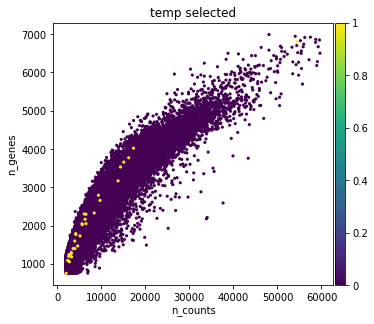


Cluster: 5_4_7 	size: 29
Present: ['beta']
beta           0.862069
beta_immune    0.034483
gamma          0.034483
NA             0.034483
beta_delta     0.034483
Name: type_union, dtype: float64

Cluster: 5_4_8 	size: 23
Present: ['alpha']
alpha                0.956522
alpha_endothelial    0.043478
Name: type_union, dtype: float64

Cluster: 5_4_9 	size: 19
Present: ['alpha', 'alpha_immune']
alpha                       0.578947
alpha_immune                0.368421
alpha_endothelial_immune    0.052632
Name: type_union, dtype: float64


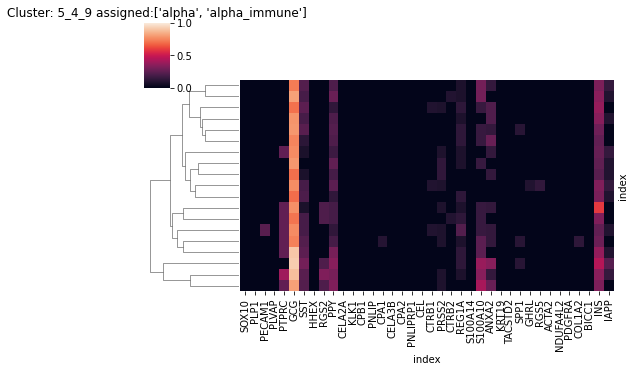

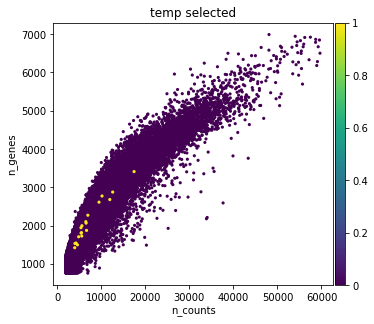

checking  5_5
checking  5_6
checking  5_7


In [55]:
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()), key=int):
    print("checking ", cluster)
    if len(cluster_annotation[cluster]) != 1 or len([cell_type for cell_type in cluster_annotation[cluster]]) == 0:
        print('**** Original cluster', cluster)
        res = 1
        adata_temp, assignment_df_temp = get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster, cluster_col='cluster', assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp, res=res, original_cluster=cluster, assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp, cluster_col='leiden_scaled_r' + str(res), present_threshold = 0.2, nomain_threshold=0.8, save=True, cluster_annotation=cluster_annotation, adata_main=adata_rawnormalised)

In [56]:
# Some gamma clusters are mixed but it does not seem they could be resolved

cluster_annotation['1_0_0'] = ['beta']
cluster_annotation['1_0_1'] = ['gamma']
cluster_annotation['1_0_2'] = ['delta']
cluster_annotation['1_0_3'] = ['delta']
cluster_annotation['1_0_4'] = ['gamma']
cluster_annotation['1_0_6'] = ['gamma']
cluster_annotation['1_0_7'] = ['gamma']
cluster_annotation['1_0_8'] = ['beta']
cluster_annotation['1_0_9'] = ['gamma']
cluster_annotation['1_0_10'] = ['gamma']
cluster_annotation['1_0_11'] = ['beta']
#cluster_annotation['1_0_12'] = ['delta']
cluster_annotation['1_0_13'] = ['gamma'] # dubious annotation
cluster_annotation['1_0_14'] = ['beta']
cluster_annotation['1_4_0'] = ['beta']
cluster_annotation['1_4_1'] = ['beta']
cluster_annotation['1_4_2'] = ['beta']
cluster_annotation['1_4_3'] = ['beta']
cluster_annotation['1_4_4'] = ['delta']
cluster_annotation['1_4_5'] = ['beta_endothelial']
cluster_annotation['1_4_6'] = ['beta']
cluster_annotation['3_4_0'] = ['beta']
cluster_annotation['3_4_1'] = ['schwann']
cluster_annotation['3_4_3'] = ['schwann']
cluster_annotation['3_4_4'] = ['beta']
cluster_annotation['3_4_5'] = ['alpha']
cluster_annotation['3_4_6'] = ['beta']
cluster_annotation['3_4_7'] = ['NA']
cluster_annotation['3_4_8'] = ['beta']
cluster_annotation['3_4_9'] = ['schwann']
cluster_annotation['3_4_10'] = ['beta']
cluster_annotation['5_4_2'] = ['beta']
cluster_annotation['5_4_3'] = ['alpha']
cluster_annotation['5_4_6'] = ['alpha']
cluster_annotation['5_4_9'] = ['alpha']

The below would assign cells to cts based on marker scores. This will not be used. Instead cells will be given annotation NA.

#### Add cluster based annotation to adata

In [57]:
# Display cluster annotation of clusters that will be used
clusters = list(adata_rawnormalised.obs['cluster'].unique())
clusters.sort()
for cluster in clusters:
    print(cluster, cluster_annotation[cluster])

0 ['alpha']
1_0_0 ['beta']
1_0_1 ['gamma']
1_0_10 ['gamma']
1_0_11 ['beta']
1_0_12 ['delta', 'other']
1_0_13 ['gamma']
1_0_14 ['beta']
1_0_2 ['delta']
1_0_3 ['delta']
1_0_4 ['gamma']
1_0_5 ['gamma']
1_0_6 ['gamma']
1_0_7 ['gamma']
1_0_8 ['beta']
1_0_9 ['gamma']
1_1 ['beta']
1_2 ['beta']
1_3 ['beta']
1_4_0 ['beta']
1_4_1 ['beta']
1_4_2 ['beta']
1_4_3 ['beta']
1_4_4 ['delta']
1_4_5 ['beta_endothelial']
1_4_6 ['beta']
2 ['ductal']
3_0 ['stellate_quiescent']
3_1 ['stellate_quiescent']
3_2 ['stellate_quiescent']
3_3 ['stellate_quiescent']
3_4_0 ['beta']
3_4_1 ['schwann']
3_4_10 ['beta']
3_4_2 ['beta']
3_4_3 ['schwann']
3_4_4 ['beta']
3_4_5 ['alpha']
3_4_6 ['beta']
3_4_7 ['NA']
3_4_8 ['beta']
3_4_9 ['schwann']
3_5 ['stellate_activated']
3_6 ['stellate_quiescent']
3_7 ['endothelial']
3_8 ['stellate_quiescent']
4 ['acinar']
5_0 ['beta']
5_1 ['immune']
5_2 ['immune']
5_3 ['beta']
5_4_0 ['alpha']
5_4_1 ['alpha']
5_4_2 ['beta']
5_4_3 ['alpha']
5_4_4 ['alpha']
5_4_5 ['alpha']
5_4_6 ['alpha']
5_4_7

In [58]:
# Add cell type annotation to clusters. 
# If clusters was annotated with more than one cell type (inbcluding NA or other) set it to 'NA'.
if 'cell_type' in adata_rawnormalised.obs.columns:
    adata_rawnormalised.obs.drop('cell_type', axis=1, inplace=True)
for row_idx in adata_rawnormalised.obs.index:
    cluster = adata_rawnormalised.obs.at[row_idx, 'cluster']
    cell_type = cluster_annotation[cluster]
    if len(cell_type) != 1:
        cell_type = 'NA'
    else:
        cell_type = cell_type[0]
        
    add_category(df=adata_rawnormalised.obs, idxs=row_idx, col='cell_type', category=cell_type)

### Cell type annotation evaluation

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical


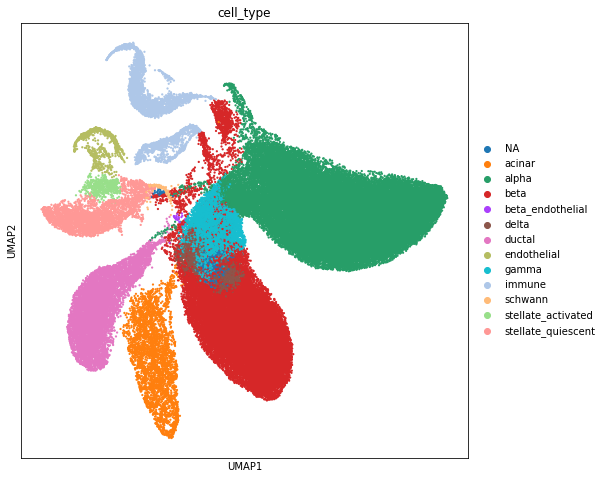

In [59]:
# Plot cell types on UMPA (pre-annotated and new ones)
rcParams['figure.figsize'] = (8, 8)
sc.pl.umap(adata_rawnormalised, color=['cell_type'], size=20, use_raw=False, wspace=0.3)

In [60]:
# Count of new cell types
adata_rawnormalised.obs.cell_type.value_counts()

alpha                 43629
beta                  25669
ductal                 7392
gamma                  5881
immune                 3923
acinar                 3626
stellate_quiescent     3446
delta                  2020
endothelial             877
NA                      640
stellate_activated      550
schwann                 173
beta_endothelial         31
Name: cell_type, dtype: int64

Text(0.5, 1.0, 'cell_type')

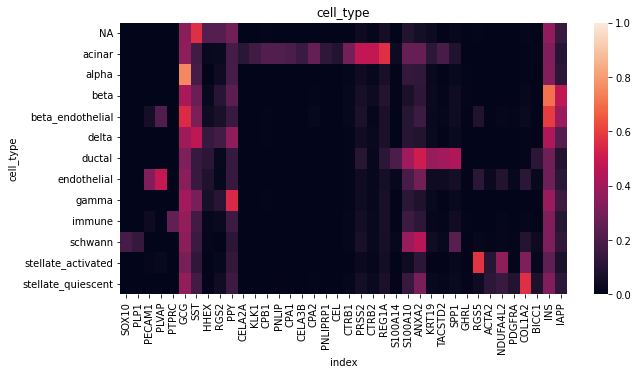

In [61]:
# Plot mean marker expression in each cluster
rcParams['figure.figsize'] = (10,5)
#fig,ax=plt.subplots()
#sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['pre_cell_type']).mean(),yticklabels=1,xticklabels=1,
#          vmin=0,vmax=1)
#ax.set_title('pre_cell_type')
fig, ax = plt.subplots()
sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['cell_type']).mean(), yticklabels=1, xticklabels=1, vmin=0, vmax=1)
ax.set_title('cell_type')

/dss/dsshome1/lxc07/gobi009/miniconda3/envs/block/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


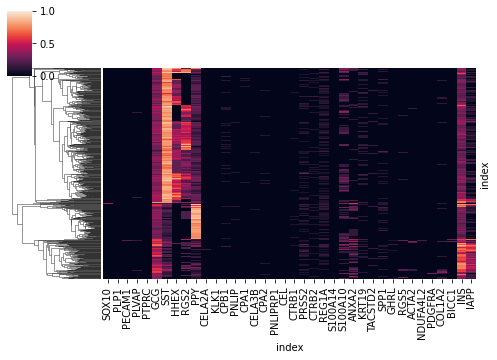

In [62]:
# Subset marker expression to NA cell type cells and plot heatmap
sb.clustermap(pd.DataFrame(scaled_expression[adata_rawnormalised.obs.cell_type == 'NA']), row_cluster=True, col_cluster=False, xticklabels=1, yticklabels=False, figsize=(7,5), vmin=0, vmax=1)

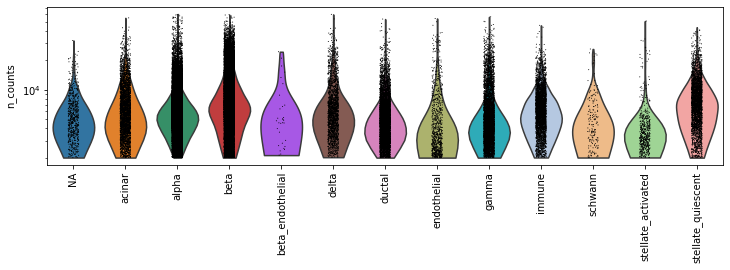

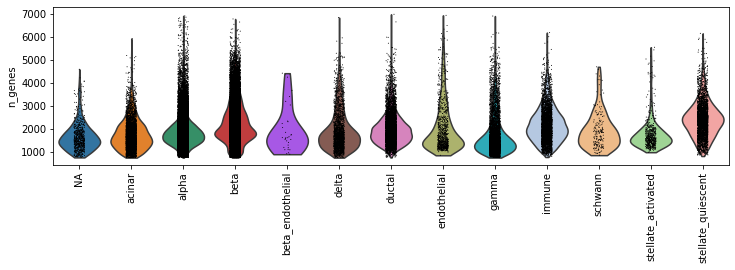

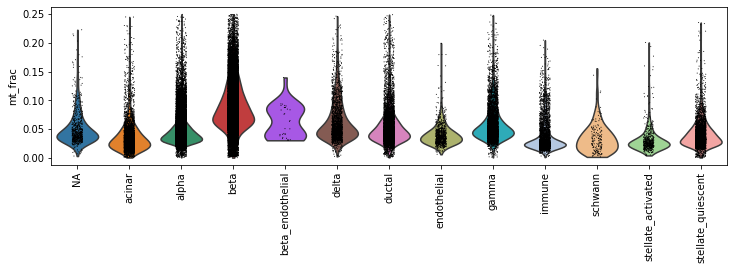

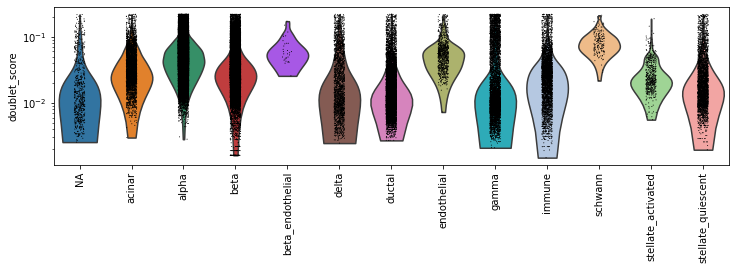

In [63]:
# QC metrics per cell type
rcParams['figure.figsize'] = (10, 3)
sc.pl.violin(adata_rawnormalised, ['n_counts'], groupby='cell_type', size=1, log=True, rotation=90)
sc.pl.violin(adata_rawnormalised, ['n_genes'], groupby='cell_type', size=1, log=False, rotation=90)
sc.pl.violin(adata_rawnormalised, ['mt_frac'], groupby='cell_type', size=1, log=False, rotation=90)
sc.pl.violin(adata_rawnormalised, 'doublet_score', groupby='cell_type', size=1, log=True, rotation=90)

In [64]:
# Add cell type to adata
adata.obs['cell_type'] = adata_rawnormalised.obs.cell_type
# Add final clusters and starting clusters to adata
adata.obs[['cluster', clusters_col]] = adata_rawnormalised.obs[['cluster', clusters_col]]
# Add cell type scores
# score_cols = [col for col in scores_df_norm.columns if '_score' in col]
# adata.obs[score_cols] = scores_df_norm[score_cols].reindex(adata.obs.index)

#### Cell type markers

Upregulated genes in each cell type compared to other cells on normalised log scaled data.

In [65]:
# Compute overexpressed genes in each cell type on normalised log scaled data
#Retain only cell types with >=10 cells and non-NA annotation
groups_counts = adata.obs.cell_type.value_counts()
groups = [cell_type for cell_type in groups_counts[groups_counts >= 10].index if cell_type != 'NA']
# Compute markers
sc.tl.rank_genes_groups(adata, groupby='cell_type', groups=groups, use_raw=False)
sc.tl.filter_rank_genes_groups(adata, groupby='cell_type', use_raw=False)

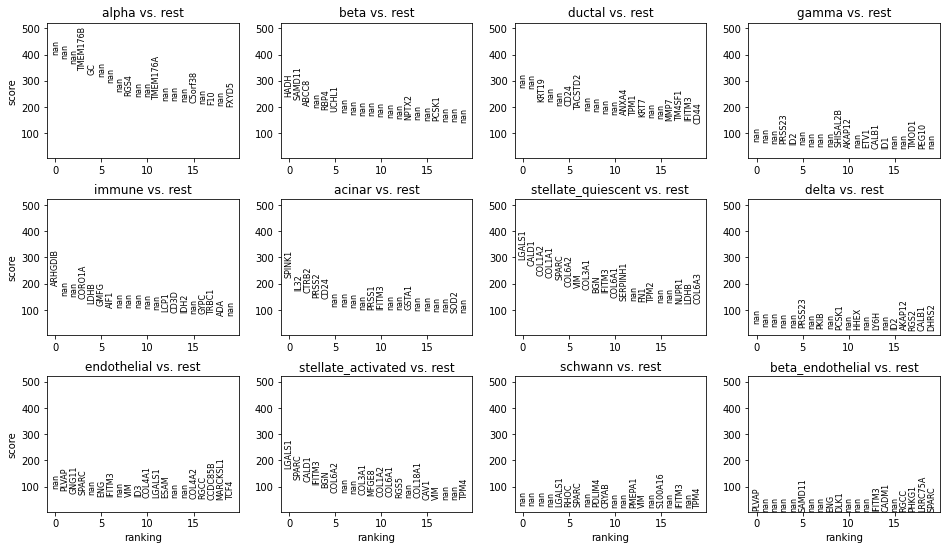

In [66]:
# Plot cell_type vs rest upregulated genes
rcParams['figure.figsize'] = (4, 3)
sc.pl.rank_genes_groups(adata,key='rank_genes_groups_filtered')

categories: NA, acinar, alpha, etc.
var_group_labels: alpha, beta, ductal, etc.


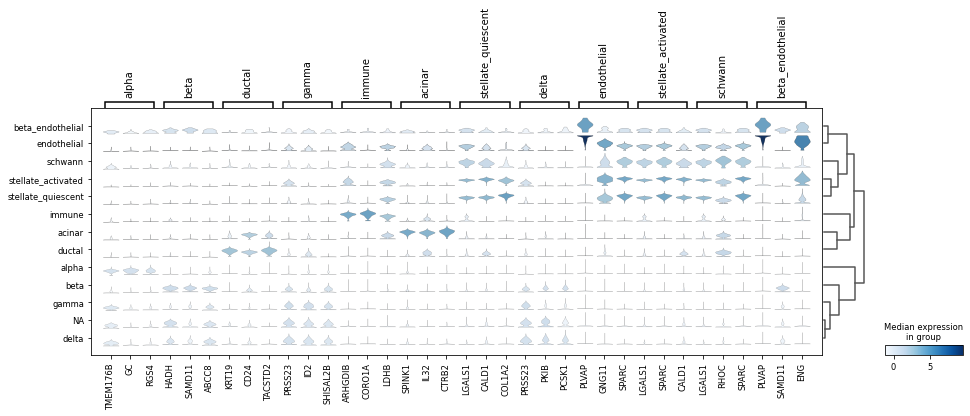

In [67]:
# Plot expression of cell type upregulated genes on normalised log transformed z-scaled data
adata_scl.uns['rank_genes_groups_filtered'] = adata.uns['rank_genes_groups_filtered']
adata_scl.obs['cell_type'] = adata.obs['cell_type']
sc.pl.rank_genes_groups_stacked_violin(adata_scl, key='rank_genes_groups_filtered', n_genes=3, use_raw=False)

### Expected doublet rates

Adapted from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6126471/#ref-7, but using 0.1 as doublet rate (described in my notes).

Expected multiplet number is calculated for each file separately.

Most above observed multiple cell type cells are likely dublets. The only ones where this is not clear are beta_delta and acinar_ductal.

In [68]:
# Singlet cell types whose multiplet rates are predicted
cell_types = ['ductal','acinar']
# DFs with expected multiplet rates
expected_dfs = []
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:', file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types = []
    cell_type_temp = adata.obs.query('file == "' + file + '" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns = dict()
    for cell_type in cell_types:
        n_celltype = cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type] = n_celltype
    print('N droplets that contain at least one:', Ns)
    
    # Calculate N (see formula in notes)
    N = emr.get_N(Ns=Ns.values())
    regex_any = '|'.join(['.*' + cell_type + '.*' for cell_type in cell_types])
    print('N:', round(N, 1), '(observed cell-containing N with relevant cell types:', cell_type_temp.str.contains(fr'{regex_any}').sum(), ')')
    
    # Calculate mu for each cell type
    mus = dict()
    for cell_type in cell_types:
        mus[cell_type] = emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:', {k:round(v, 4) for k, v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types = dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all = cell_type.split('_')
        components_relevant = [type_singlet for type_singlet in components_all if type_singlet in cell_types]
        # retain only cts containing only relevant components
        all_relevant = all([component in cell_types for component in components_all])
        if len(components_relevant) > 1 and all_relevant:
            multiplet_types[cell_type] = components_relevant
            # This does not assure that initially the cell types are not counted wrongly 
            # (e.g. including proliferative, ...)
            #if len(components_relevant) < len(components_all):
            #    warnings.warn('Multiplet type has additional unrecognised component: '+cell_type)
    #print('Relevant multiplet cell types:',multiplet_types.keys())
    
    # This also analyses O and E of singlet types, but this is not so relevant as changes in multiplets also 
    # affect it?
    #types_OE= dict(zip(cell_types,[[i] for i in cell_types]))
    #types_OE.update(multiplet_types)
    
    # Calculate O (observed) and E (expected) numbers
    expected_df = pd.DataFrame(index=multiplet_types.keys(), columns=['O_' + file, 'E_' + file])
    #for multiplet, components in types_OE.items():
    for multiplet, components in multiplet_types.items():
        absent = np.setdiff1d(cell_types, components)
        expected_df.at[multiplet, 'O_' + file] = (cell_type_temp == multiplet).sum()
        expected_df.at[multiplet, 'E_' + file] = emr.expected_multiplet(mu_present=[mus[cell_type] for cell_type in components], mu_absent=[mus[cell_type] for cell_type in absent], N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs, axis=1))
del cell_type_temp


File: SRR10751499
N droplets that contain at least one: {'ductal': 537, 'acinar': 297}
N: 1808.2 (observed cell-containing N with relevant cell types: 834 )
mu: {'ductal': 0.3524, 'acinar': 0.1794}

File: SRR10751487
N droplets that contain at least one: {'ductal': 179, 'acinar': 61}
N: 532.1 (observed cell-containing N with relevant cell types: 240 )
mu: {'ductal': 0.4101, 'acinar': 0.1218}

File: SRR10751489
N droplets that contain at least one: {'ductal': 324, 'acinar': 91}
N: 929.2 (observed cell-containing N with relevant cell types: 415 )
mu: {'ductal': 0.4287, 'acinar': 0.1031}

File: SRR10751495
N droplets that contain at least one: {'ductal': 277, 'acinar': 130}
N: 888.5 (observed cell-containing N with relevant cell types: 407 )
mu: {'ductal': 0.3736, 'acinar': 0.1582}

File: SRR10751491
N droplets that contain at least one: {'ductal': 214, 'acinar': 181}
N: 846.8 (observed cell-containing N with relevant cell types: 395 )
mu: {'ductal': 0.2913, 'acinar': 0.2405}

File: SRR1

,O_SRR10751499,E_SRR10751499,O_SRR10751487,E_SRR10751487,O_SRR10751489,E_SRR10751489,O_SRR10751495,E_SRR10751495,O_SRR10751491,E_SRR10751491,...,O_SRR10751494,E_SRR10751494,O_SRR10751497,E_SRR10751497,O_SRR10751501,E_SRR10751501,O_SRR10751484,E_SRR10751484,O_SRR10751498,E_SRR10751498


In [69]:
# Singlet cell types whose multiplet rates are predicted
cell_types = ['beta', 'delta']
# DFs with expected multiplet rates
expected_dfs = []
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:', file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types = []
    cell_type_temp = adata.obs.query('file == "' + file + '" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns = dict()
    for cell_type in cell_types:
        n_celltype = cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type] = n_celltype
    print('N droplets that contain at least one:', Ns)
    
    # Calculate N (see formula in notes)
    N = emr.get_N(Ns=Ns.values())
    regex_any = '|'.join(['.*' + cell_type + '.*' for cell_type in cell_types])
    print('N:', round(N, 1), '(observed cell-containing N with relevant cell types:', cell_type_temp.str.contains(fr'{regex_any}').sum(), ')')
    
    # Calculate mu for each cell type
    mus = dict()
    for cell_type in cell_types:
        mus[cell_type] = emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:', {k: round(v, 4) for k, v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types = dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all = cell_type.split('_')
        components_relevant = [type_singlet for type_singlet in components_all if type_singlet in cell_types]
        # retain only cts containing only relevant components
        all_relevant = all([component in cell_types for component in components_all])
        if len(components_relevant) > 1 and all_relevant:
            multiplet_types[cell_type] = components_relevant
    expected_df=pd.DataFrame(index=multiplet_types.keys(), columns=['O_' + file, 'E_' + file])
    for multiplet, components in multiplet_types.items():
        absent = np.setdiff1d(cell_types, components)
        expected_df.at[multiplet, 'O_' + file] = (cell_type_temp == multiplet).sum()
        expected_df.at[multiplet, 'E_' + file] = emr.expected_multiplet(mu_present=[mus[cell_type] for cell_type in components], mu_absent=[mus[cell_type] for cell_type in absent], N=N)
        # E that droplet contains at least one cell of each present cell type,
        # but does not exclude other cell types from being present
        #expected_df.at[multiplet,'E_atleast']=emr.expected_multiplet(
        #    mu_present=[mus[cell_type] for cell_type in components], 
        #    mu_absent=[], 
        #    N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs, axis=1))
del cell_type_temp


File: SRR10751499
N droplets that contain at least one: {'beta': 1768, 'delta': 154}
N: 4513.6 (observed cell-containing N with relevant cell types: 1922 )
mu: {'beta': 0.4971, 'delta': 0.0347}

File: SRR10751487
N droplets that contain at least one: {'beta': 316, 'delta': 16}
N: 789.4 (observed cell-containing N with relevant cell types: 332 )
mu: {'beta': 0.5113, 'delta': 0.0205}

File: SRR10751489
N droplets that contain at least one: {'beta': 1109, 'delta': 39}
N: 2745.1 (observed cell-containing N with relevant cell types: 1148 )
mu: {'beta': 0.5175, 'delta': 0.0143}

File: SRR10751495
N droplets that contain at least one: {'beta': 751, 'delta': 88}
N: 1952.1 (observed cell-containing N with relevant cell types: 839 )
mu: {'beta': 0.4857, 'delta': 0.0461}

File: SRR10751491
N droplets that contain at least one: {'beta': 2172, 'delta': 118}
N: 5437.8 (observed cell-containing N with relevant cell types: 2290 )
mu: {'beta': 0.5099, 'delta': 0.0219}

File: SRR10751488
N droplets tha

,O_SRR10751499,E_SRR10751499,O_SRR10751487,E_SRR10751487,O_SRR10751489,E_SRR10751489,O_SRR10751495,E_SRR10751495,O_SRR10751491,E_SRR10751491,...,O_SRR10751494,E_SRR10751494,O_SRR10751497,E_SRR10751497,O_SRR10751501,E_SRR10751501,O_SRR10751484,E_SRR10751484,O_SRR10751498,E_SRR10751498


C: Both acinar_ductal and beta_delta are likely multiplets.

In [70]:
adata.obs.cell_type.unique().to_list()

['alpha',
 'beta',
 'gamma',
 'delta',
 'immune',
 'ductal',
 'stellate_activated',
 'acinar',
 'NA',
 'stellate_quiescent',
 'endothelial',
 'schwann',
 'beta_endothelial']

In [71]:
# Reassign cell types to multiplet
multiplets = ['acinar_alpha_beta_delta_ductal', 'alpha_ductal', 'acinar_ductal', 'ductal_immune',
           'delta_ductal', 'acinar_beta', 'acinar_alpha', 'beta_delta', 'beta_ductal',
           'acinar_endothelial', 'acinar_immune', 'ductal_endothelial', 'acinar_beta_ductal']
adata.obs['cell_type_multiplet'] = adata.obs.cell_type.replace(multiplets, 'multiplet')

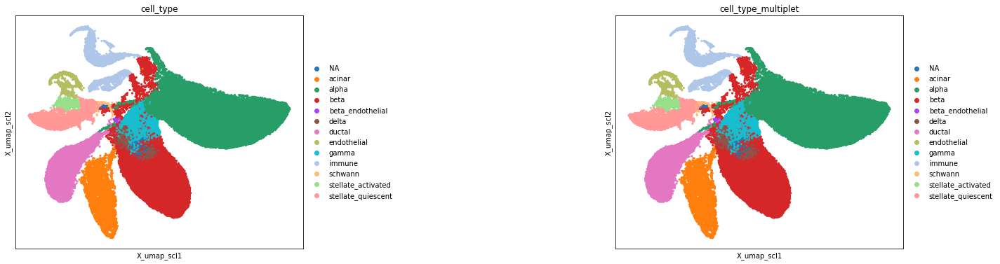

In [72]:
# Plot new cell types
rcParams['figure.figsize'] = (6, 6)
sc.pl.embedding(adata, 'X_umap_scl', color=['cell_type', 'cell_type_multiplet'], size=40, use_raw=False, wspace=0.9)

<AxesSubplot:>

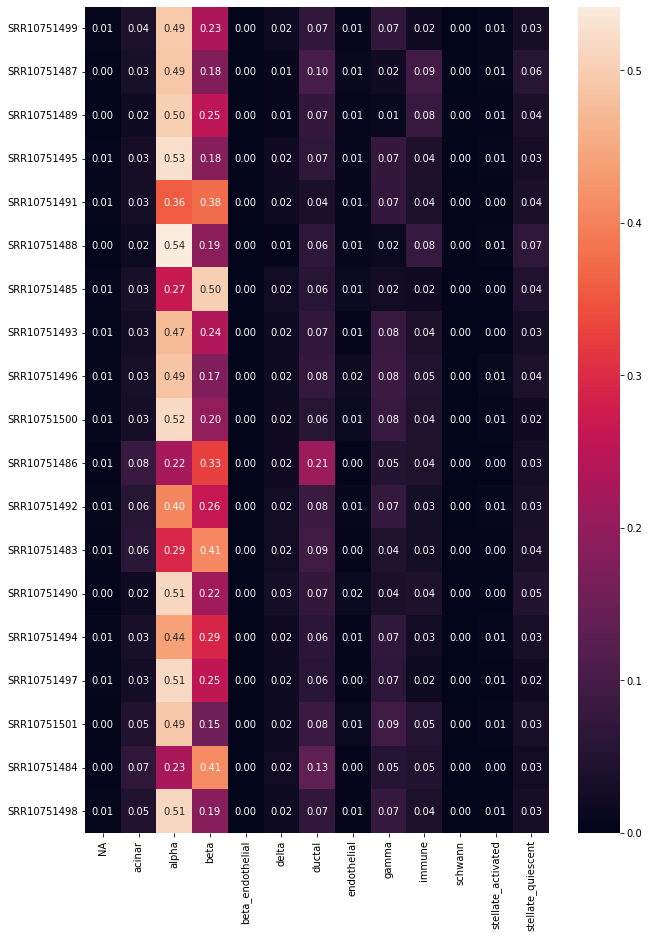

In [73]:
# ratio of each ct in each study
ct_study_ratios = pd.DataFrame()
for (study, hc), ratio in adata.obs.groupby('file', observed=True)['cell_type_multiplet'].value_counts(normalize=True, sort=False).iteritems():
    ct_study_ratios.at[study, hc] = ratio
ct_study_ratios.fillna(0, inplace=True)
fig, ax = plt.subplots(figsize=(ct_study_ratios.shape[1] * 0.8, ct_study_ratios.shape[0] * 0.8))
sb.heatmap(ct_study_ratios, ax=ax, annot=True, fmt='.2f')

<AxesSubplot:>

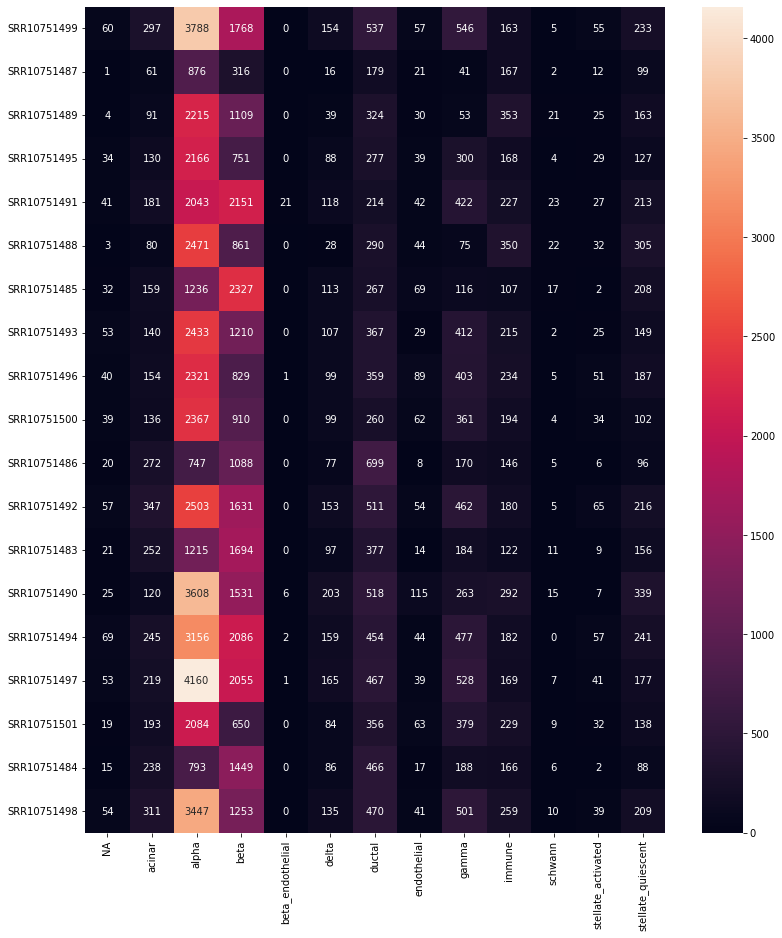

In [74]:
# Number of each ct in each study
ct_study_ratios = pd.DataFrame()
for (study, hc), ratio in adata.obs.groupby('file', observed=True)['cell_type_multiplet'].value_counts(normalize=False, sort=False).iteritems():
    ct_study_ratios.at[study, hc] = ratio
ct_study_ratios.fillna(0, inplace=True)
fig, ax = plt.subplots(figsize=(ct_study_ratios.shape[1] * 1, ct_study_ratios.shape[0] * 0.8))
sb.heatmap(ct_study_ratios, ax=ax, annot=True, fmt='.0f')

### Save annotation

In [75]:
h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)
# adata.write(shared_folder+"data_annotated.h5ad")
#pickle.dump(adata, open(shared_folder + 'data_annotated.pkl', 'wb'))

NameError: name 'UID2' is not defined